In [1]:
# General Imports
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Scripts 
folder_path = os.path.abspath("scripts")
sys.path.append(folder_path)

# Derivation of Column Density Maps Routine
from Derive_Density_Maps import derive_density_maps, convert_to_mass

# Visualization Tools
from visualization_tools import show_regions_with_sections, show_Minkowski_Functionals, show_sections_OrionB_vertical, visualize_Mass_Size_D_Diagrams, visualize_Mass_Size_D_Diagramm_as_One

# Minkowski Functionals
from Minkowski_Fractal_Dimension import standard_minkowski_functionals, horizontal_marching_minkowski_functionals, vertical_marching_minkowski_functionals, intercept_corrected_minkowski_functionals 

# Box Counting 
from Box_Counting_Fractal_Dimension import box_counting

# Dendogram-like Tracker
from region_tracker import track_largest_regions, save_regions_to_pickle, load_regions_from_pickle, get_region_from_fractal_dimension_mass_and_size

# Derive Density Maps
N_H2, N_H2_OA, N_H2_OB, wcs = derive_density_maps()

[16:01:31] ERROR    PARDISO solver not installed, run `pip install pypardiso`. Otherwise,          ]8;id=557371;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py\_workspace.py]8;;\:]8;id=175271;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py#56\56]8;;\
                    simulations will be slow. Apple M chips not supported.                                         

## 📌**Fractal Dimension of Orion A and B**

### *First Results and Comparison between Box-Counting Method and Minkowski Functionals Method*

This section presents the initial results of the Fractal Dimension Analysis using Minkowski Functionals, comparing them with more standard methods such as the Box-Counting Method. The main result are a well-defined trend as well as an inverse correlation between these two methods. This phenomenon is further explored in `Validity_PA_BC.ipynb`, but the core insights are summarized below:

### **Simulations**
- Simpler structures (e.g., lines, planes, circles, Gaussian Random Fields) exhibit the same disparity between methods.
- A closer analysis of the formulas used reveals that this disparity is *expected*.

### **Example: Line Structure Analysis**
1. Expected dimension for a simple line:
   - Since it is not a fractal structure, it should return its typical Euclidean Dimension: **D = 1**.
   - The Box-Counting Method confirms this.
   - However, the Perimeter-Area (PA) Method returns **D = 2**.

2. Why does the PA Method return **D = 2**?
   - Consider the formula: 
     $$ A \propto k \cdot P^{2/D} $$
   - For a line:
     - **Area:** $ A = 1 \cdot l $
     - **Perimeter:** $ P = l $
     - **Proportionality factor:** $ k = 1 $
   - Substituting these values:
     $$ l \propto l^{2/D} $$
   - Solving for $ D $, we find that **D must be 2**.

### **General Trends**
- Similar behavior is observed for planes and circles:
  - When the proportionality factor is accounted for, we obtain **D = 1** for planes and circles.
- This suggests that both the Box-Counting Method and the PA Method reveal the same trend but define dimension differently.
  - BTW the issue of definition is quite a wide-spread one, and one of the main take-away is to always check how the fractal dimension is defined.
- Extra Analysis I did a while ago: the Power-Spectrum Distribution Analyis shows the same trend as the PA relation. not quite the focus of the thesis and will not be further explored, but an extra sanity check!

### **Implications**
- **Smooth, line-like, less space-filling structures tend toward D = 2 with the PA method.**
- **Rough, plane-like, space-filling structures tend toward D = 1.**
- Should the proportionality factor be included in this analysis? Doing so assumes specific geometric properties of the regions, which we should try to avoid. See `Validity_PA_BC.ipynb` for more details.
- **Deeper within the cloud, structures tend to behave more smoothly, line-like, showing a simplification of the geomtry.**

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.measure import perimeter, euler_number

def standard_minkowski_functionals_2(data, threshold_min=1e20, threshold_max=1e22, thresholds=None):
    """
    Compute the standard Minkowski functionals (area, perimeter, Euler characteristic) 
    and fractal dimension for a given 2D dataset across a range of thresholds.

    Parameters:
    ----------
    data : numpy.ndarray
        A 2D array representing the map dataset for which Minkowski functionals are computed.
    threshold_min : float, optional
        The minimum threshold value for generating the binary masks. Default is 1e20.
    threshold_max : float, optional
        The maximum threshold value for generating the binary masks. Default is 1e22.
    thresholds : numpy.ndarray or None, optional
        An array of threshold values to use. If None, thresholds are generated 
        logarithmically between `threshold_min` and `threshold_max`.

    Returns:
    -------
    dict
        A dictionary containing the following keys:
        - "thresholds": The array of threshold values used.
        - "areas": The computed areas (v0) for each threshold.
        - "perimeters": The computed perimeters (v1) for each threshold.
        - "euler_chars": The computed Euler characteristics (v2) for each threshold.
        - "fractal_dimension": The computed fractal dimensions based on the log-log 
          relationship between area and perimeter.

    Notes:
    -----
    - Minkowski functionals are geometric measures used to describe the morphology 
      of structures in 2D or 3D datasets. 
    - The fractal dimension is derived from the relationship between the logarithm 
      of the perimeter and the logarithm of the area.
    - The relation D = (2 * log(perimeter)) / (log(area)) is used to compute the fractal dimension.
    """
    # If thresholds are not provided, generate them using a logarithmic scale
    if thresholds is None:
        thresholds = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 100)

    # Store Minkowski Functional values
    areas = []
    perimeters = []
    euler_chars = []

    # Process each threshold
    for threshold in thresholds:
        # Create binary mask
        mask = data >= threshold

        # Compute Area (v0)
        area = np.sum(mask)
        areas.append(area)

        # Compute Perimeter (v1)
        mask_perim = perimeter(mask)
        perimeters.append(mask_perim)

        # Compute Euler Characteristic (v2)
        euler_char = euler_number(mask)
        euler_chars.append(euler_char)

    # Convert to log scale for fractal dimension analysis
    log_areas = np.log10(areas)
    log_perimeters = np.log10(np.array(perimeters))

    # Fit a linear model to log_areas and log_perimeters to retrieve D
    # valid_indices = (log_areas > -np.inf) & (log_perimeters > -np.inf)
    # filtered_log_areas = log_areas[valid_indices]
    # filtered_log_perimeters = log_perimeters[valid_indices]

    # Perform linear regression
    coefficients = np.polyfit(log_perimeters, log_areas, 1)
    slope, intercept = coefficients
    # Calculate correlation coefficient between log_perimeters and log_areas
    corr_coef = np.corrcoef(log_perimeters, log_areas)[0, 1]
    print(f"Correlation coefficient: {corr_coef:.4f}")

    # Fractal dimension D is twice the slope
    m = 2/slope
    print(2/slope)

    D = (2 * log_perimeters) / (log_areas)

    # Estimate uncertainties
    sigma_A = np.sqrt(areas)  # rough Poisson error
    sigma_P = 0.5 * np.sqrt(perimeters)  # rough guess; adjust based on your system

    # Convert to np arrays
    areas = np.array(areas)
    perimeters = np.array(perimeters)

    # Partial derivatives
    dD_dP = 2 / (np.log(10) * perimeters * log_areas)
    dD_dA = -2 * log_perimeters / (np.log(10) * areas * log_areas**2)

    # Propagate uncertainties
    sigma_D = np.sqrt((dD_dP * sigma_P)**2 + (dD_dA * sigma_A)**2)

    plt.figure(figsize=(8, 6))
    plt.scatter(log_perimeters, log_areas, label="Data Points", color="blue")
    plt.plot(log_perimeters, slope * log_perimeters + intercept, label=f"Fit with D = {2/slope:.2f}", color="red")
    plt.xlabel("log(P)", fontsize=20)
    plt.ylabel("log(A)", fontsize=20)
    # plt.title("Log-Log Plot of Areas vs Perimeters with Linear Fit")
    plt.legend(fontsize=14)
    plt.grid(True)
    plt.show()

    return {
        "thresholds": thresholds,
        "areas": areas,
        "perimeters": perimeters,
        "euler_chars": euler_chars,
        "fractal_dimension": D,
        "sigma_D": sigma_D
    }

Correlation coefficient: 0.9882
1.3610600396741388


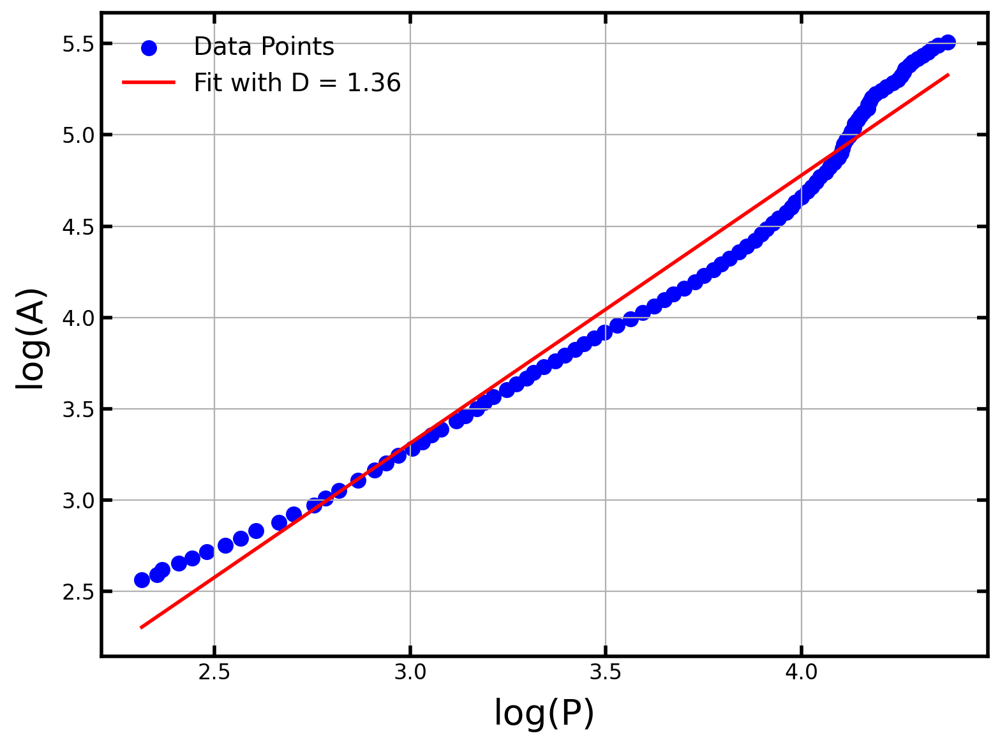

In [3]:
# Orion A
region_name = "Orion A"

# overall, these work best for the whole region
threshold_min = 2.5e21
threshold_max = 7.5e22 # This works well when the fractal dimension is calculated for the whole region, but for the individual regions it might be good to go further down
# threshold_max = 1.0e23

# Minkowski
results_OA = standard_minkowski_functionals_2(N_H2_OA, threshold_min = threshold_min, threshold_max = threshold_max)

nominal_fractal_dimension_OA = results_OA["fractal_dimension"]

# results_OA_intercept = intercept_corrected_minkowski_functionals(N_H2_OA, threshold_min = threshold_min, threshold_max = threshold_max)

# differences_OA = nominal_fractal_dimension_OA - results_OA_intercept["fractal_dimension"]
# print(differences_OA)

# Box-Counting
fractal_dimensions_OA_BC = []

# thresholds_BC = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 1) # Less thresholds for faster computation, but still enough to see the trend

# for threshold in thresholds_BC:
#     mask = N_H2_OA >= threshold

#     fractal_dim = box_counting(mask) 
#     fractal_dimensions_OA_BC.append(fractal_dim)

# Plot the results
# show_Minkowski_Functionals(region_name, results_OA)

# plt.figure(figsize=(14, 8))

# plt.subplot(1, 2, 1)
# plt.plot(results_OA["thresholds"], results_OA["fractal_dimension"], 'o-')
# plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name, fontweight='bold')
# plt.xlabel('Threshold')
# plt.ylabel('Fractal Dimension')
# plt.xscale("log")

# plt.subplot(1, 2, 2)
# plt.plot(thresholds_BC, fractal_dimensions_OA_BC, 'o-')
# plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name, fontweight='bold')
# plt.xlabel('Threshold')
# plt.ylabel('Fractal Dimension')
# plt.xscale("log")

# plt.tight_layout()
# plt.show()

# show_regions_with_sections(N_H2_OA, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

1.331505526505143


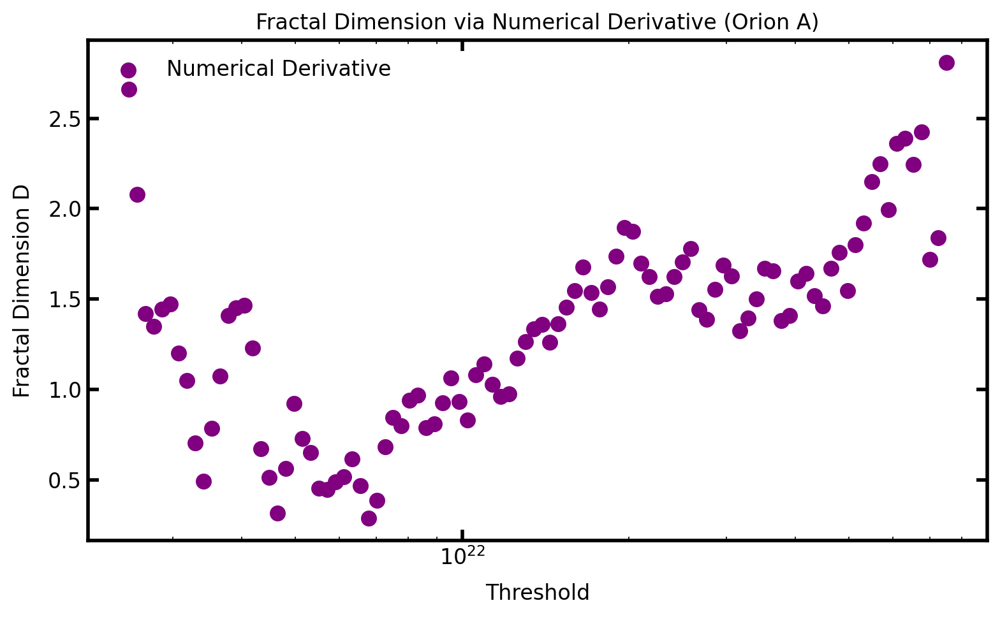

[322581 309275 296408 284208 272537 261303 250565 240541 230374 220581
 210739 201268 191950 183244 175031 167328 159979 152901 145996 139368
 132733 126572 120498 114925 109403 104175  98957  93975  89014  84290
  79711  75144  70714  66577  62642  58937  55480  52051  48853  45792
  42847  40164  37501  35073  32780  30577  28511  26439  24552  22807
  21117  19617  18219  16906  15669  14492  13437  12463  11522  10626
   9813   9042   8310   7738   7169   6666   6191   5764   5362   5005
   4654   4310   4006   3684   3411   3166   2901   2699   2449   2266
   2086   1923   1750   1596   1453   1278   1131   1025    937    834
    755    677    618    566    522    481    451    416    389    365]
[23578.92188189 22293.60903994 21595.10337656 20995.81091662
 20405.01488534 19760.60363037 19181.10406365 18803.55781573
 18354.01052179 18239.78512504 17956.92621465 17597.23783111
 17077.69053717 16471.35035001 15970.75027822 15410.47610824
 15113.53498275 14951.40904504 14762.12982443

In [ ]:
# Calculate D = 2 * d log(P) / d log(A) for Orion A

# Use the already computed arrays from results_OA
log_areas = np.log10(results_OA["areas"])
log_perimeters = np.log10(results_OA["perimeters"])

# Compute the numerical derivative d log(P) / d log(A)
dlogP = np.gradient(log_perimeters)
dlogA = np.gradient(log_areas)
D_numeric = 2*dlogP / dlogA

print(np.average(D_numeric))
plt.figure(figsize=(8, 5))
plt.scatter(results_OA["thresholds"], D_numeric, label="Numerical Derivative", color="purple")
# plt.scatter(results_OA["thresholds"], results_OA["fractal_dimension"], label="Direct Formula", color="orange")
plt.xscale("log")
plt.xlabel("Threshold")
plt.ylabel("Fractal Dimension D")
plt.title("Fractal Dimension via Numerical Derivative (Orion A)")
plt.legend()
plt.show()

print(results_OA["areas"])
print(results_OA["perimeters"])

Correlation coefficient: 0.9976
1.3987404748945234


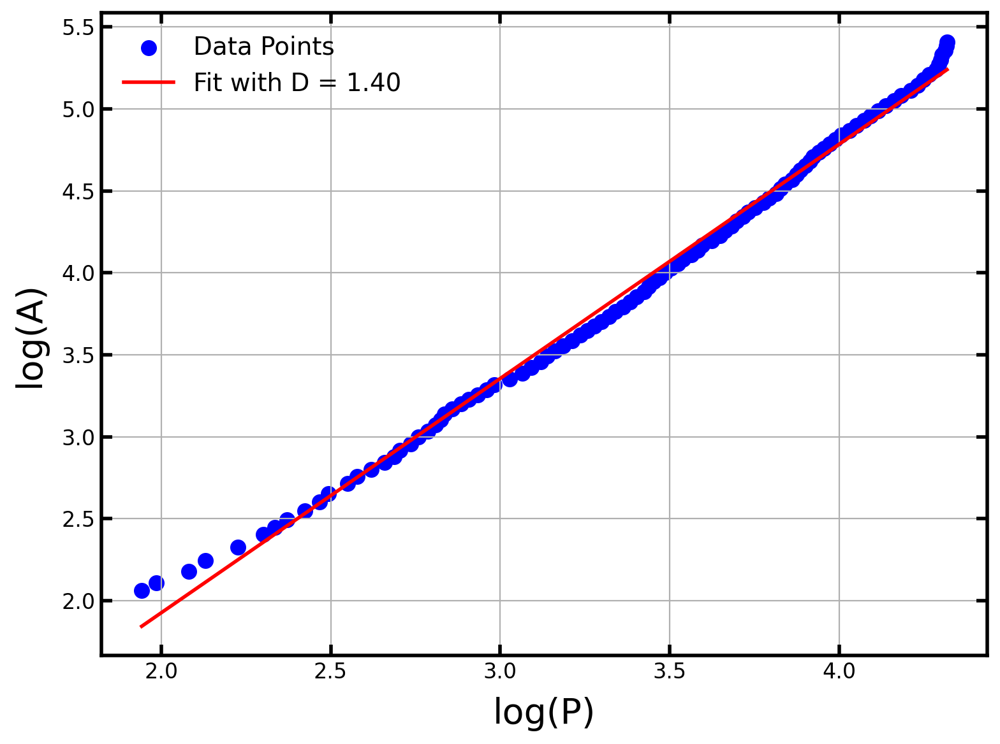

In [4]:
# Orion B
region_name = "Orion B"

# Minkowski
results_OB = standard_minkowski_functionals_2(N_H2_OB, threshold_min = threshold_min, threshold_max = threshold_max)

nominal_fractal_dimension_OB = results_OB["fractal_dimension"]
# results_OB = intercept_corrected_minkowski_functionals(N_H2_OB, threshold_min = threshold_min, threshold_max = threshold_max)

# results_OB_intercept = intercept_corrected_minkowski_functionals(N_H2_OB, threshold_min = threshold_min, threshold_max = threshold_max)

# differences_OB = nominal_fractal_dimension_OB - results_OB_intercept["fractal_dimension"]

# Box-Counting
# fractal_dimensions_OB_BC = []

# thresholds_BC = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 1) # Less thresholds for faster computation, but still enough to see the trend

# for threshold in thresholds_BC:
#     mask = N_H2_OB >= threshold

#     fractal_dim = box_counting(mask)
#     fractal_dimensions_OB_BC.append(fractal_dim)

# # Plot the results
# show_Minkowski_Functionals(region_name, results_OB)

# plt.figure(figsize=(14, 8))

# plt.subplot(1, 2, 1)
# plt.plot(results_OB["thresholds"], results_OB["fractal_dimension"], 'o-')
# plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name, fontweight='bold')
# plt.xlabel('Threshold')
# plt.ylabel('Fractal Dimension')
# plt.xscale("log")

# plt.subplot(1, 2, 2)
# plt.plot(thresholds_BC, fractal_dimensions_OB_BC, 'o-')
# plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name, fontweight='bold')
# plt.xlabel('Threshold')
# plt.ylabel('Fractal Dimension')
# plt.xscale("log")

# plt.tight_layout()
# plt.show()

# show_regions_with_sections(N_H2_OB, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

<>:14: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\m'
C:\Users\User\AppData\Local\Temp\ipykernel_3980\3672626525.py:14: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Column Density Threshold [$\mathrm{cm}^{-2}$]', fontsize=13)


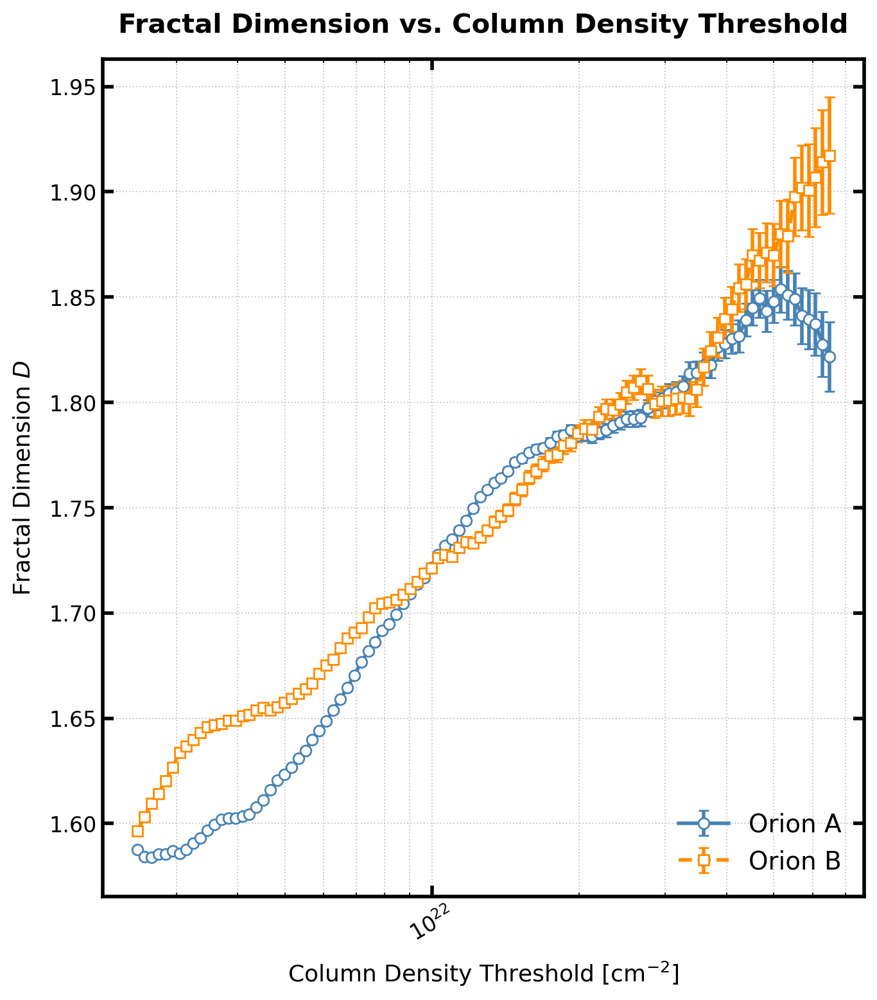

In [5]:
plt.figure(figsize=(7, 8))

# Plot with error bars
plt.errorbar(results_OA["thresholds"], results_OA["fractal_dimension"], 
             yerr=results_OA["sigma_D"], fmt='o-', 
             label="Orion A", color='steelblue', markersize=6, capsize=3)

plt.errorbar(results_OB["thresholds"], results_OB["fractal_dimension"], 
             yerr=results_OB["sigma_D"], fmt='s--', 
             label="Orion B", color='darkorange', markersize=6, capsize=3)

# Title and labels
plt.title("Fractal Dimension vs. Column Density Threshold", fontweight='bold', fontsize=15, pad=15)
plt.xlabel('Column Density Threshold [$\mathrm{cm}^{-2}$]', fontsize=13)
plt.ylabel('Fractal Dimension $D$', fontsize=13)

# Log scale and grid
plt.xscale("log")
plt.grid(True, which='both', linestyle=':', linewidth=0.7, alpha=0.7)

# Tick adjustments
plt.tick_params(axis='both', which='major', labelsize=12)
plt.xticks(rotation=30)

# Legend
plt.legend(frameon=False, fontsize=14, loc='lower right')

# Tight layout for slides
plt.tight_layout()

## 📌**Region Analysis**

### *Behavior of Single Regions Compared to the General Trend*

Now that we have established that the trend is meaningful, we can examine whether it also holds when analyzing smaller regions. First, we divide the map using simple straight-line divisions. Then, we define regions based on the map itself. The latter method operates as follows:

- At each threshold, interconnected structures are identified using `ndimage.label(mask)`.
- Since many structures (especially at lower thresholds) consist of only a few pixels, only the 5-10 largest structures at each threshold are analyzed (i.e., the PA analysis is performed on each of them).
- The fractal dimension of these 10 structures at each threshold is plotted.
- Mass and size are also calculated, allowing for the creation of an M-L-D diagram.

### **Results**

In all cases, the trend remains but is often less steep for individual regions compared to the fractal dimension of the overall structure. 

The final results connect the fractal dimension with the mass and size of these structures, revealing a subtle trend, particularly around an aspect ratio \( A < 3 \) (representing prolate spheroids). This suggests that the geometry of the structure's contour changes—becoming smoother and more linear—toward very small star-forming cores, which follow a more spherical structure.

The code still needs to be reviewed (e.g. some 1-5 solar masses cores are expected to show up, but they don't), but I think these are good preliminary results so far. 

Kolmogorov turbulence predicts a fractal dimension of 5/3 (1.7) for turbulent isobar models, and this might be observable in our results!

### **Open Points**
- The structures are disconnected from one another between thresholds levels. In principle it should be possible to track the evolution (breaking apart) of structures in substructures.
- Mass and Size calculations to be checked.

In [ ]:
n_regions = 3 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = horizontal_marching_minkowski_functionals(N_H2_OA, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(7e22), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_regions_with_sections(N_H2_OA, n_regions, thresholds_to_plot)

2.9157464360395497
3.1761204943910912
3.344183608344616


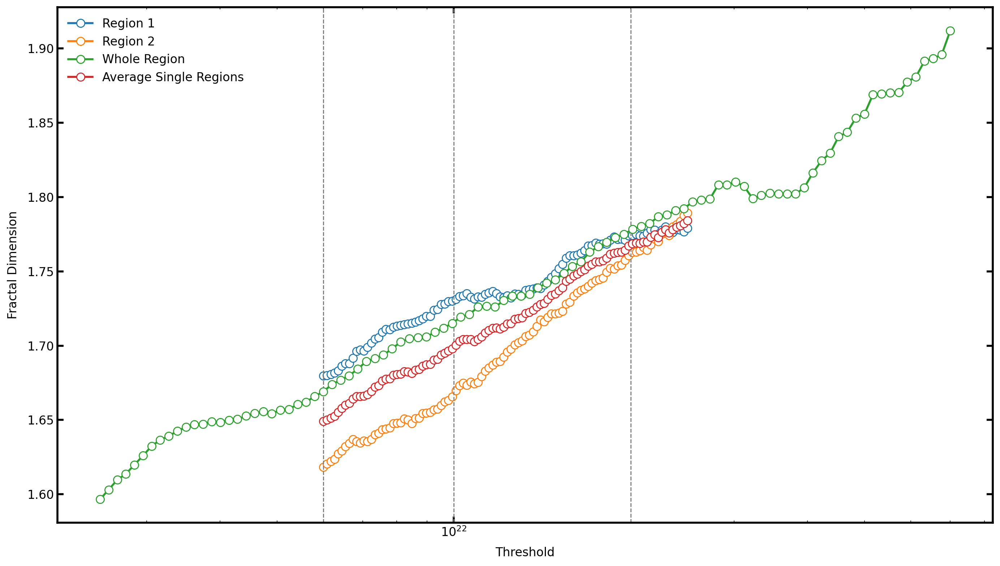

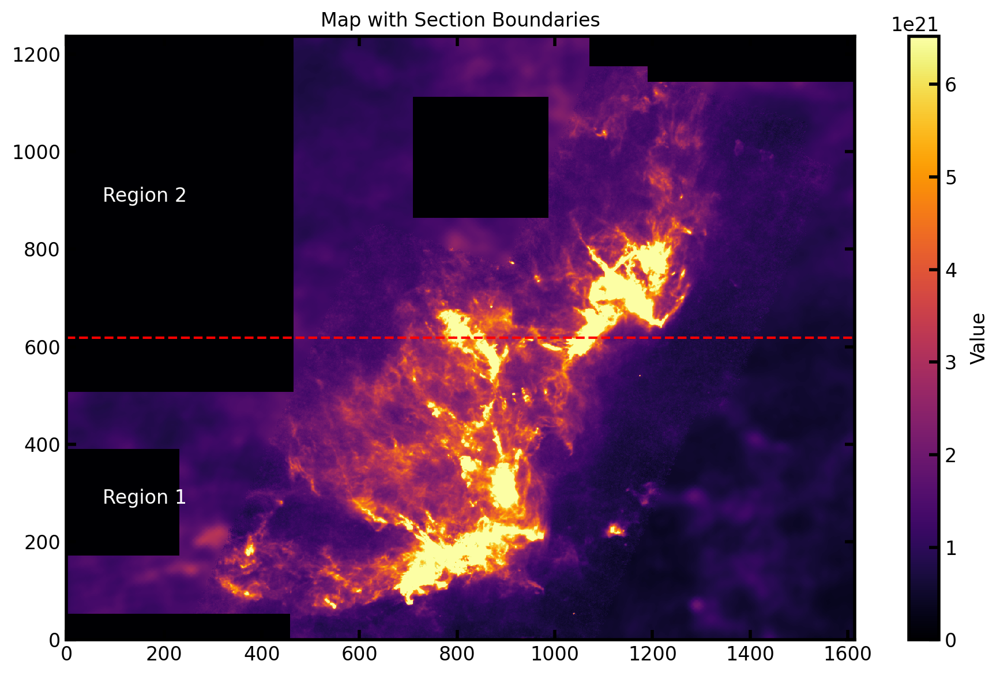

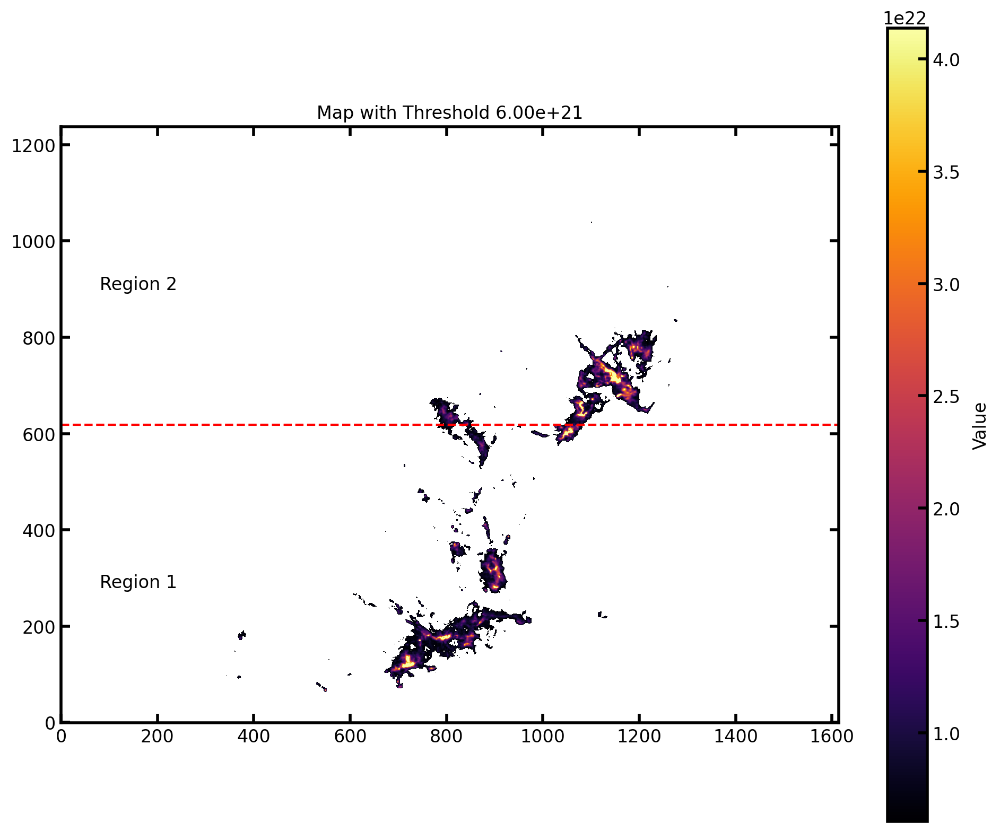

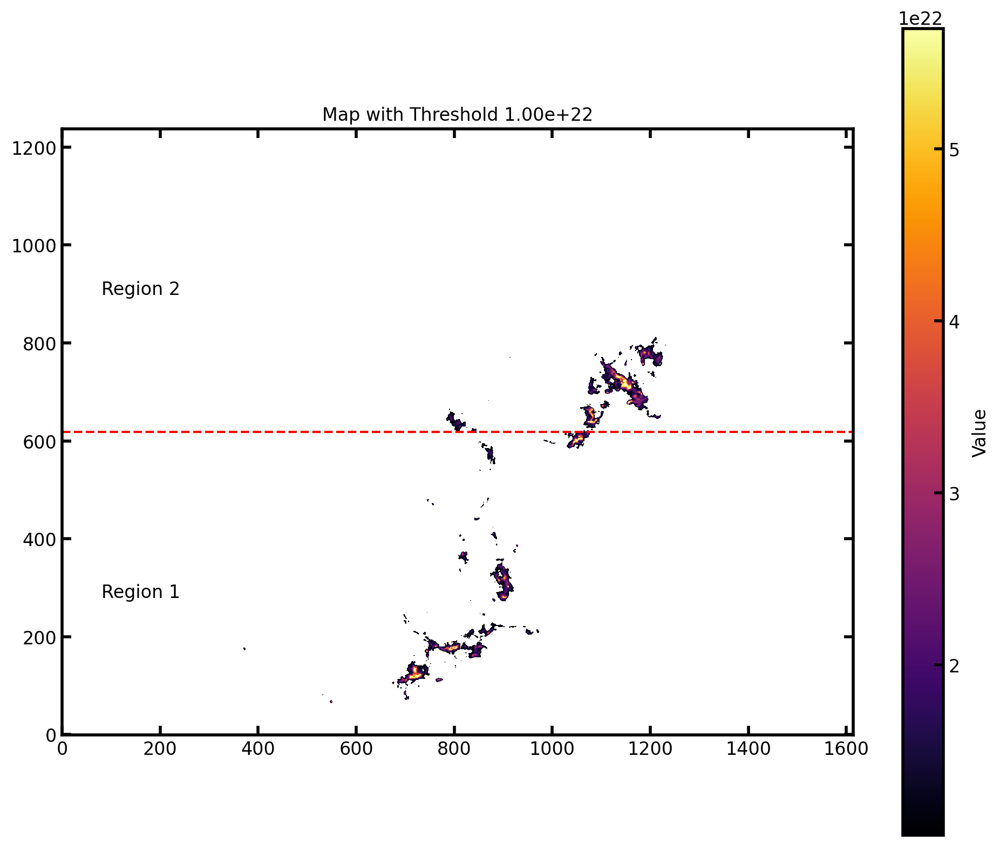

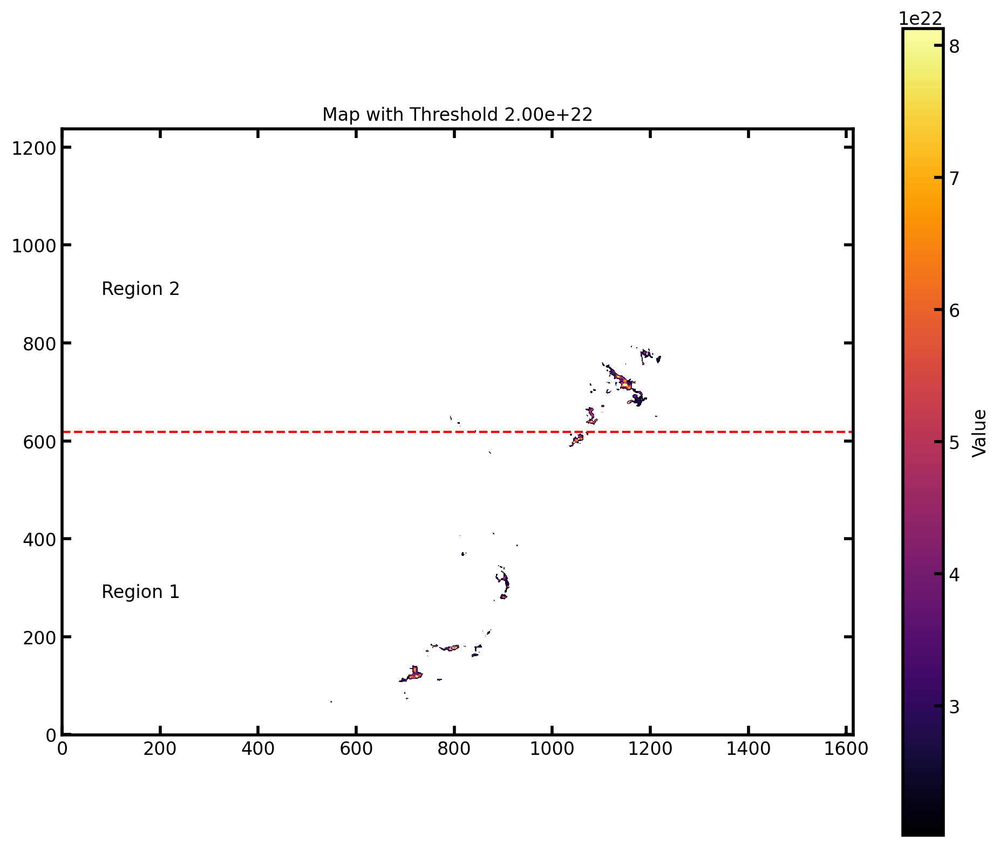

In [ ]:
n_regions = 2 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = vertical_marching_minkowski_functionals(N_H2_OB, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(7e22), 100)
plt.plot(thresholds_full, results_OB["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_sections_OrionB_vertical(N_H2_OB, n_regions, thresholds_to_plot)

In [37]:
import scipy.ndimage as ndimage
from skimage.measure import perimeter
import numpy as np

import pickle

def pca_major_axis(region_coords):
    """
    Computes the major axis length of a structure using PCA.
    The major axis is the square root of the largest eigenvalue of the covariance matrix.
    """
    if len(region_coords) < 2:
        return 0  # If only one pixel, size is zero

    # Center the coordinates
    centered_coords = region_coords - np.mean(region_coords, axis=0)

    # Compute covariance matrix and its eigenvalues
    cov_matrix = np.cov(centered_coords, rowvar=False)
    eigenvalues, _ = np.linalg.eigh(cov_matrix)

    # The largest eigenvalue corresponds to the major axis squared
    major_axis = 2 * np.sqrt(np.max(eigenvalues))  # Factor 2 to approximate full length

    return major_axis

def calculate_mass_and_size(region_mask, M_H2, pc_per_px):
    """
    Calculate the mass and the major axis of a structure using PCA.
    - Mass: Summed pixel values converted to solar masses.
    - Size: Major axis computed from PCA eigenvalues.
    """
    # Compute total mass
    mass = np.sum(M_H2[region_mask])

    # Find structure coordinates
    region_coords = np.column_stack(np.where(region_mask))

    if len(region_coords) == 0:
        return mass, 0  # If no region is found, return zero size

    # Compute the major axis length using PCA
    major_axis_length = pca_major_axis(region_coords)

    # Convert size to parsecs
    size_parsecs = major_axis_length * pc_per_px

    return mass, size_parsecs

def compute_fractal_dimension(region_mask):
    """
    Compute the fractal dimension of a binary region using the Perimeter-Area relation.
    
    Parameters:
        region_mask (ndarray): Boolean mask of the structure.
        
    Returns:
        float: Estimated fractal dimension.
    """
    area = np.sum(region_mask)
    
    # Compute perimeter using dilation technique
    mask_perimeter = perimeter(region_mask)

    if area > 0 and mask_perimeter > 0:
        return 2*(np.log10(mask_perimeter) / np.log10(area))
    return None  # Invalid case (avoid division errors)

def track_largest_regions_NEW(N_H2, M_H2, thresholds, pc_per_px, num_top_regions=None, min_region_size_px=50):
    """
    Extract regions at each threshold and compute their properties.
    """
    regions = {}

    for threshold in thresholds:
        mask = N_H2 >= threshold  
        labeled_regions, num_features = ndimage.label(mask)

        if num_features == 0:
            print(f"[{threshold}] No regions found.")
            continue

        region_sizes = {
            region_id: np.sum(labeled_regions == region_id)
            for region_id in range(1, num_features + 1)
        }

        # Optional: Filter by size or pick top N
        region_ids = sorted(region_sizes, key=region_sizes.get, reverse=True)
        if num_top_regions is not None:
            region_ids = region_ids[:num_top_regions]

        saved_count = 0
        for region_id in region_ids:
            size_px = region_sizes[region_id]
            if size_px < min_region_size_px:
                continue

            region_mask = labeled_regions == region_id
            fractal_dim = compute_fractal_dimension(region_mask)
            mass, size = calculate_mass_and_size(region_mask, M_H2, pc_per_px)

            region_key = f"{threshold}_{region_id}"
            regions[region_key] = {
                "threshold": threshold,
                "fractal_dimension": fractal_dim,
                "mass": mass,
                "size": size,
                "region_mask": region_mask
            }
            saved_count += 1

        print(f"[{threshold}] Found {num_features} regions, saved {saved_count}.")

    return regions

[2.4999999999999995e+21] Found 801 regions, saved 10.
[2.5906544706295043e+21] Found 764 regions, saved 10.
[2.6845962344770563e+21] Found 635 regions, saved 10.
[2.781944494673271e+21] Found 630 regions, saved 10.
[2.88282277686738e+21] Found 525 regions, saved 10.
[2.987359085969617e+21] Found 528 regions, saved 10.
[3.095686068577144e+21] Found 472 regions, saved 10.
[3.2079411812899425e+21] Found 448 regions, saved 10.
[3.3242668651301144e+21] Found 457 regions, saved 10.
[3.4448107262859726e+21] Found 407 regions, saved 10.
[3.569725723410091e+21] Found 375 regions, saved 10.
[3.6991703617093994e+21] Found 392 regions, saved 10.
[3.833308894073048e+21] Found 404 regions, saved 10.
[3.972311529493674e+21] Found 358 regions, saved 10.
[4.1163546490463993e+21] Found 333 regions, saved 10.
[4.2656210296994414e+21] Found 324 regions, saved 10.
[4.4203000762408365e+21] Found 275 regions, saved 10.
[4.5805880616149063e+21] Found 274 regions, saved 10.
[4.746688375973919e+21] Found 285 re

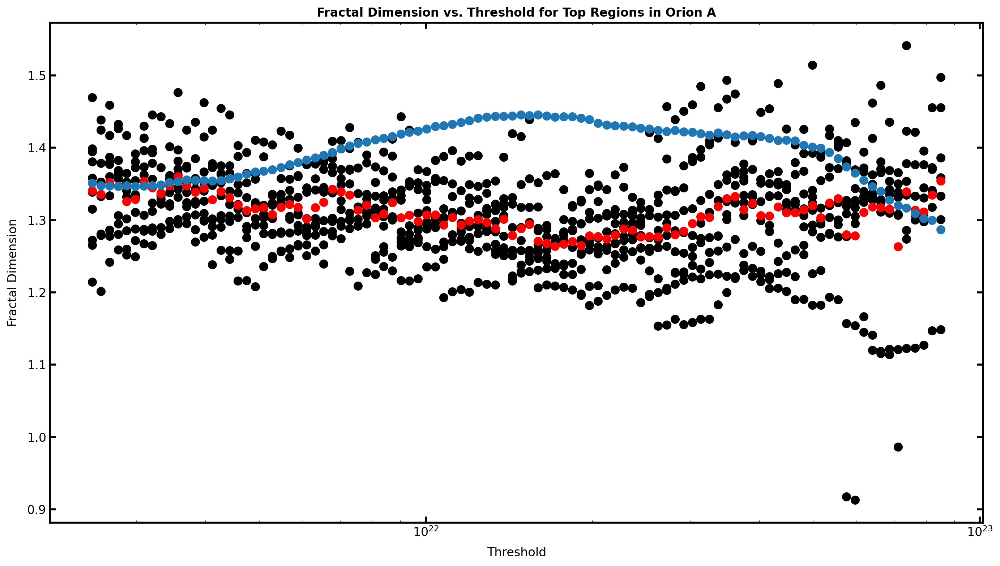

In [40]:
# Dendograms-like approach to retrieve regions

pixel_scale = 0.00417
distance = 412 
radians = 180/np.pi #conversion factor: rad in deg
rad_per_px = pixel_scale/radians
pc_per_px = np.sin(rad_per_px)*distance

M_H2_OA = convert_to_mass(N_H2_OA)

thresholds = np.logspace(np.log10(2.5e21), np.log10(8.5e22), 100) 

if os.path.exists("top_regions_data_OA.pkl"):
    top_regions_data_OA = load_regions_from_pickle("top_regions_data_OA.pkl")
else:
    top_regions_data_OA = track_largest_regions_NEW(N_H2_OA, M_H2_OA, thresholds, pc_per_px, num_top_regions=10, min_region_size_px=8)
    # save_regions_to_pickle(top_regions_data_OA, "top_regions_data_OA.pkl")

# Plot fractal dimensions for each threshold
thresholds = np.unique([region_data["threshold"] for region_data in top_regions_data_OA.values()])

plt.figure(figsize=(14, 8))

average_fractal_dimensions = []

for i, threshold in enumerate(thresholds):
    fractal_dimensions = [
        region_data["fractal_dimension"] - differences_OA[i]
        for region_data in top_regions_data_OA.values()
        if region_data["threshold"] == threshold
    ]
    plt.scatter(
        [threshold] * len(fractal_dimensions),
        fractal_dimensions,
        label=f"Threshold: {threshold:.2e}",
        color="black"
    )
    if fractal_dimensions:
        average_fractal_dimensions.append(np.mean(fractal_dimensions))
    else:
        average_fractal_dimensions.append(np.nan)

plt.scatter(thresholds, average_fractal_dimensions, color='red', label="Average Fractal Dimension")

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(8.5e22), 100)
plt.scatter(thresholds_full, results_OA_intercept["fractal_dimension"], label="Whole Region")

plt.xscale("log")
plt.xlabel("Threshold")
plt.ylabel("Fractal Dimension")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion A", fontweight='bold')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Assumed available: N_H2_OA, convert_to_mass, track_largest_regions, load/save functions, compute_fractal_dimension, results_OA
pixel_scale = 0.00417  # deg/pixel
distance = 412  # pc
radians = 180 / np.pi
rad_per_px = pixel_scale / radians
pc_per_px = np.sin(rad_per_px) * distance

# Mass map
M_H2_OA = convert_to_mass(N_H2_OA)

# Define thresholds
threshold_min = 2.5e21
threshold_max = 7e22
thresholds = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 50)

# Load or compute region data
if os.path.exists("top_regions_data_OA.pkl"):
    top_regions_data_OA = load_regions_from_pickle("top_regions_data_OA.pkl")
else:
    top_regions_data_OA = track_largest_regions(N_H2_OA, M_H2_OA, thresholds, pc_per_px, num_top_regions=10)
    save_regions_to_pickle(top_regions_data_OA, "top_regions_data_OA.pkl")

# Plot
plt.figure(figsize=(14, 8))

# Plot each tracked region's evolution
for region_id, region_info in top_regions_data_OA.items():
    thresholds_r = [entry["threshold"] for entry in region_info["threshold_data"]]
    D_values = [entry["fractal_dimension"] for entry in region_info["threshold_data"]]
    plt.plot(thresholds_r, D_values, marker='o', alpha=0.6, label=f"Region {region_id}")

# Compute and plot average D across regions at each threshold
all_thresholds = sorted(set(entry["threshold"] for r in top_regions_data_OA.values() for entry in r["threshold_data"]))
avg_Ds = []

for t in all_thresholds:
    Ds = []
    for region_info in top_regions_data_OA.values():
        for entry in region_info["threshold_data"]:
            if entry["threshold"] == t:
                Ds.append(entry["fractal_dimension"])
    avg_Ds.append(np.mean(Ds) if Ds else np.nan)

plt.plot(all_thresholds, avg_Ds, color='red', lw=2.5, label="Average Fractal Dimension")

# Optional: overlay fractal dimension of the whole region
thresholds_full = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], label="Whole Region", color='gray', linestyle='--')

# Final plot formatting
plt.xscale("log")
plt.xlabel("Threshold (cm$^{-2}$)", fontsize=12)
plt.ylabel("Fractal Dimension D", fontsize=12)
plt.title("Fractal Dimension vs. Threshold for Tracked Regions in Orion A", fontweight='bold', fontsize=14)
plt.legend(loc="best", fontsize=10)
plt.grid(True, which='both', linestyle=':', linewidth=0.5)
plt.tight_layout()
plt.show()

KeyError: 'threshold_data'

<Figure size 1400x800 with 0 Axes>

[2.4999999999999995e+21] Found 788 regions, saved 10.
[2.686548470286679e+21] Found 696 regions, saved 10.
[2.8870170732798547e+21] Found 592 regions, saved 10.
[3.1024445207646086e+21] Found 525 regions, saved 10.
[3.33394703256378e+21] Found 504 regions, saved 10.
[3.582724120140386e+21] Found 422 regions, saved 10.
[3.8500648017689376e+21] Found 392 regions, saved 10.
[4.137354281478771e+21] Found 313 regions, saved 10.
[4.4460811263762985e+21] Found 259 regions, saved 10.
[4.777844979534689e+21] Found 225 regions, saved 10.
[5.134364848414324e+21] Found 184 regions, saved 10.
[5.517488011760436e+21] Found 165 regions, saved 10.
[5.929199591128037e+21] Found 177 regions, saved 10.
[6.371632836627722e+21] Found 160 regions, saved 10.
[6.847080180188233e+21] Found 158 regions, saved 10.
[7.358005113605976e+21] Found 137 regions, saved 10.
[7.907054952927816e+21] Found 152 regions, saved 10.
[8.497074555304375e+21] Found 145 regions, saved 10.
[9.131121059385935e+21] Found 132 regions,

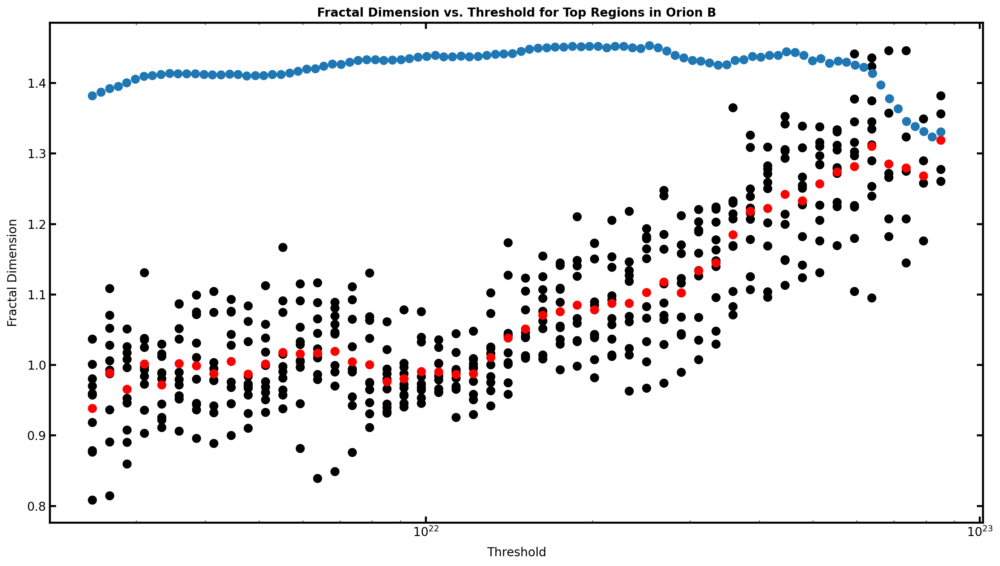

In [41]:
M_H2_OB = convert_to_mass(N_H2_OB)

# thresholds = np.logspace(np.log10(2.5e21), np.log10(7e22), 50) 
thresholds = np.logspace(np.log10(2.5e21), np.log10(8.5e22), 50) 
if os.path.exists("top_regions_data_OB.pkl"):
    top_regions_data_OB = load_regions_from_pickle("top_regions_data_OB.pkl")
else:
    top_regions_data_OB = track_largest_regions_NEW(N_H2_OB, M_H2_OB, thresholds, pc_per_px, num_top_regions=10, min_region_size_px=8)
    # save_regions_to_pickle(top_regions_data_OB, "top_regions_data_OB.pkl")

# Plot fractal dimensions for each threshold
thresholds = np.unique([region_data["threshold"] for region_data in top_regions_data_OB.values()])

plt.figure(figsize=(14, 8))

average_fractal_dimensions = []

for threshold in thresholds:
    fractal_dimensions = [
        region_data["fractal_dimension"] - differences_OB[i]
        for region_data in top_regions_data_OB.values()
        if region_data["threshold"] == threshold
    ]
    plt.scatter(
        [threshold] * len(fractal_dimensions),
        fractal_dimensions,
        label=f"Threshold: {threshold:.2e}",
        color="black"
    )
    if fractal_dimensions:
        average_fractal_dimensions.append(np.mean(fractal_dimensions))
    else:
        average_fractal_dimensions.append(np.nan)


plt.scatter(thresholds, average_fractal_dimensions, color='red', label="Average Fractal Dimension")
# thresholds_full = np.logspace(np.log10(2.5e21), np.log10(7e22), 100)
plt.scatter(thresholds_full, results_OB_intercept["fractal_dimension"], label="Whole Region")

plt.xscale("log")
plt.xlabel("Threshold")
plt.ylabel("Fractal Dimension")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion B", fontweight='bold')
plt.show()

In [47]:
for threshold in thresholds:
    for region_id, region_data in top_regions_data_OB.items():
        if region_data["threshold"] == threshold:
            region_data["fractal_dimension"] -= differences_OB[thresholds.tolist().index(threshold)]


In [48]:
for threshold in thresholds:
    for region_id, region_data in top_regions_data_OA.items():
        if region_data["threshold"] == threshold:
            region_data["fractal_dimension"] -= differences_OA[thresholds.tolist().index(threshold)]


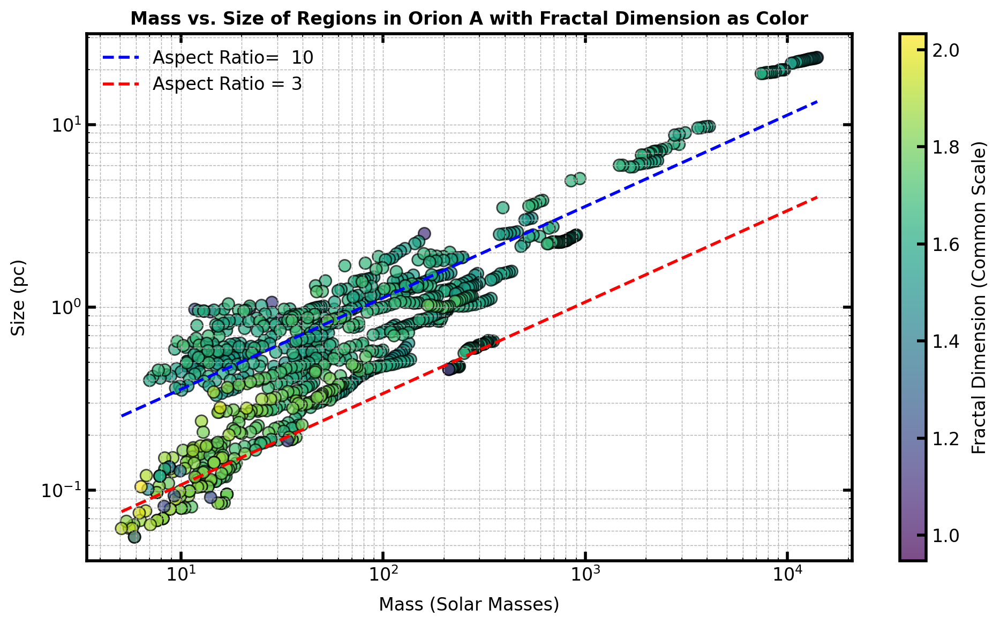

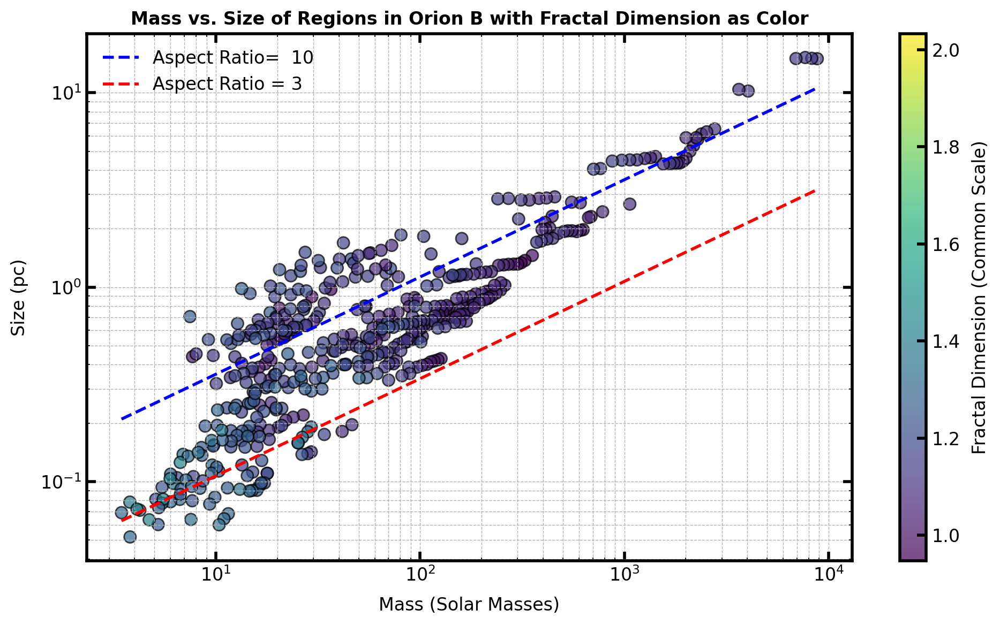

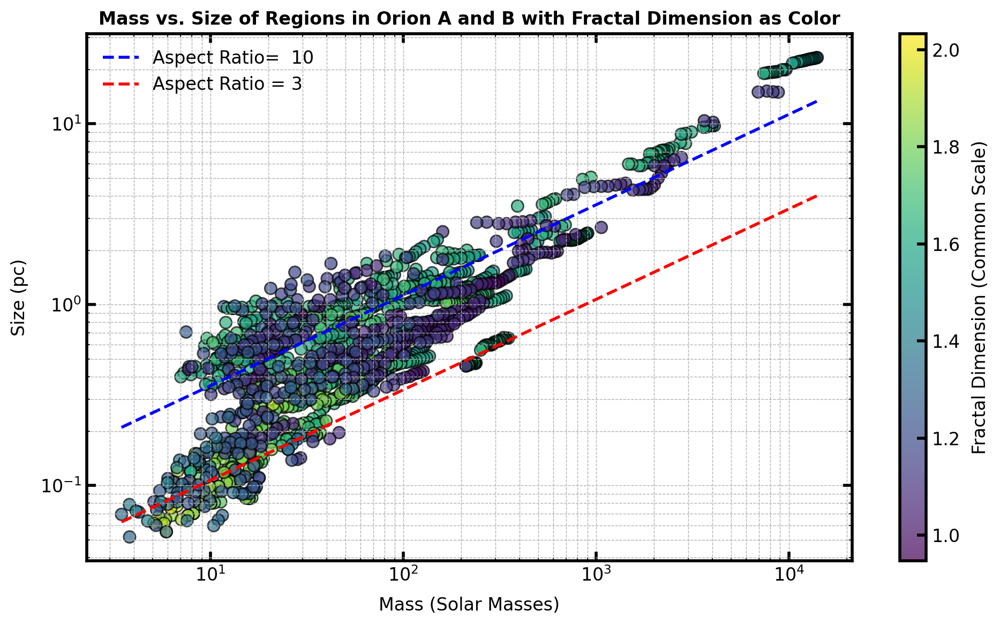

In [49]:
# Extract fractal dimensions, sizes, and masses for Orion A and B
fractal_dims_OA = [region_data["fractal_dimension"] for region_data in top_regions_data_OA.values()]
sizes_OA = [region_data["size"] for region_data in top_regions_data_OA.values()]
masses_OA = [region_data["mass"] for region_data in top_regions_data_OA.values()]

fractal_dims_OB = [region_data["fractal_dimension"] for region_data in top_regions_data_OB.values()]
sizes_OB = [region_data["size"] for region_data in top_regions_data_OB.values()]
masses_OB = [region_data["mass"] for region_data in top_regions_data_OB.values()]

# Single Regions
visualize_Mass_Size_D_Diagrams(fractal_dims_OA, fractal_dims_OB, masses_OA, masses_OB, sizes_OA, sizes_OB)

# All
visualize_Mass_Size_D_Diagramm_as_One(fractal_dims_OA, fractal_dims_OB, masses_OA, masses_OB, sizes_OA, sizes_OB)

Smallest mass in Orion B: 4.088008088283368
Higest D in Orion B: 2.0
1


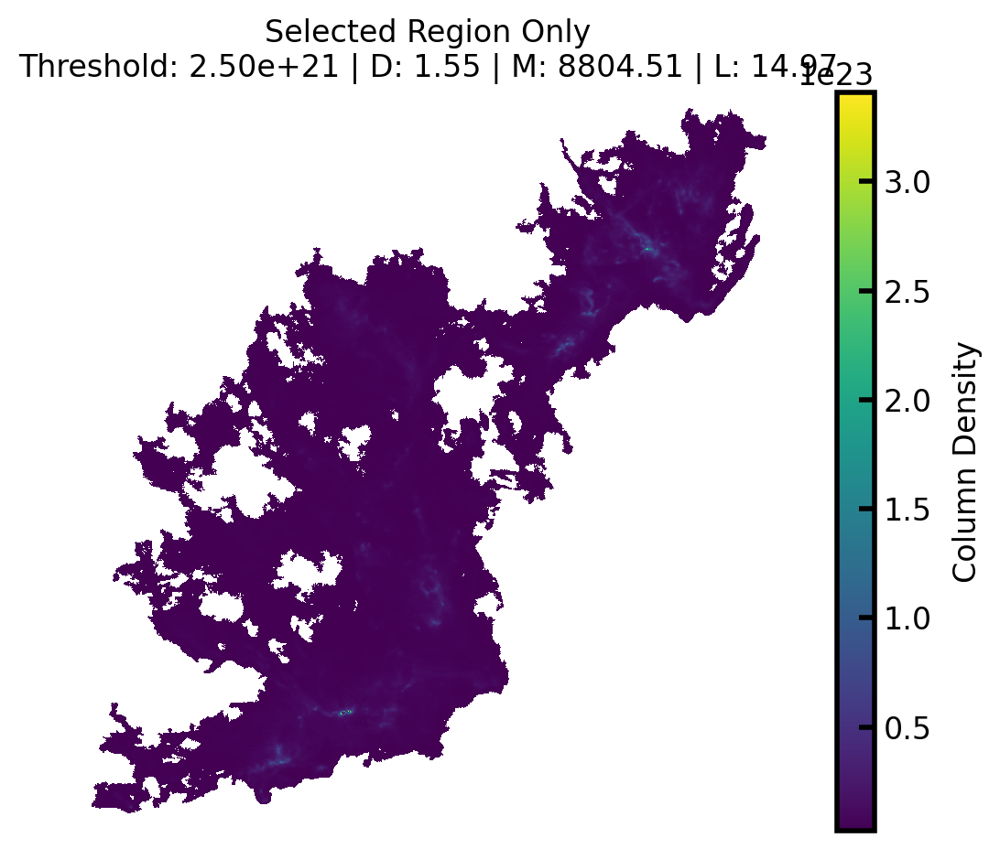

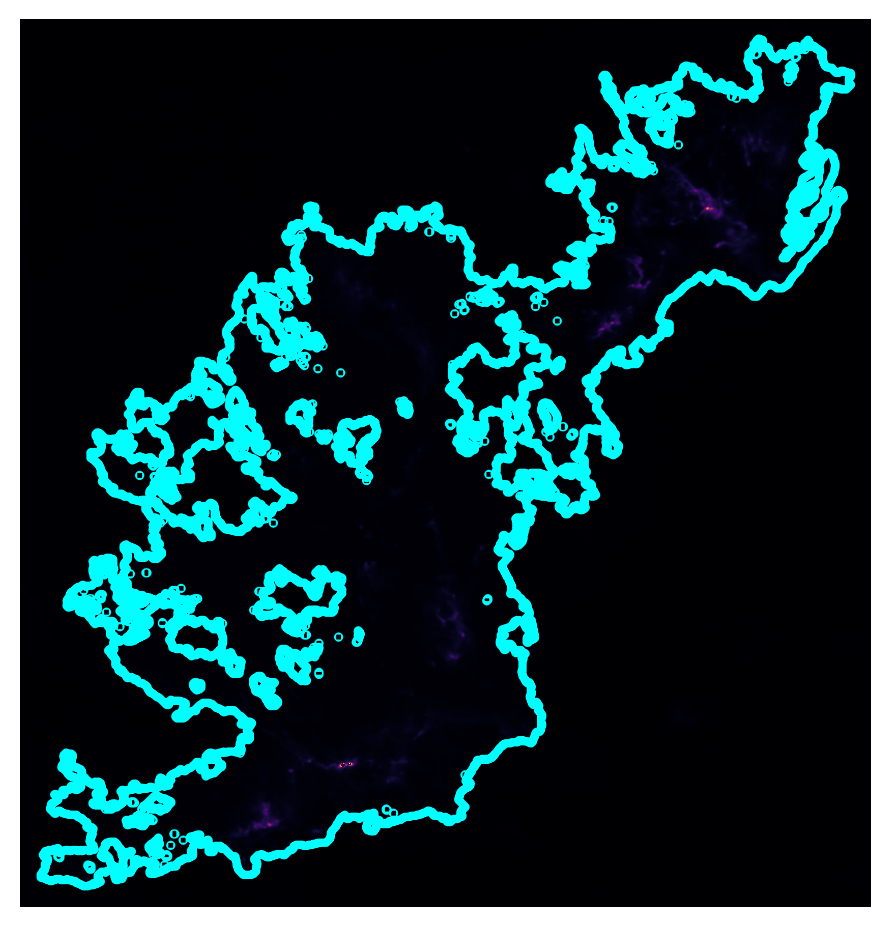

In [26]:
def get_region_from_fractal_dimension_mass_and_size_NEW(
    regions,
    fractal_dim=None,
    size=None,
    mass=None,
    fractal_tolerance=0.05,
    size_tolerance=0.5,
    mass_tolerance=3
):
    """
    Extract regions that match the given fractal dimension, size, and/or mass criteria.

    Parameters:
        regions (dict): Dictionary of regions with their properties.
        fractal_dim (float, optional): Target fractal dimension to match.
        size (float, optional): Target size to match.
        mass (float, optional): Target mass to match.
        *_tolerance (float): Allowed absolute tolerance for each property.

    Returns:
        list: List of region IDs that match the criteria.
    """
    matching_regions = []

    for region_id, properties in regions.items():
        matches_fractal = False
        matches_size = False
        matches_mass = False

        if fractal_dim is not None:
            region_fractal_dim = properties["fractal_dimension"]
            matches_fractal = (fractal_dim - fractal_tolerance) <= region_fractal_dim <= (fractal_dim + fractal_tolerance)

        if size is not None:
            region_size = properties["size"]
            matches_size = (size - size_tolerance) <= region_size <= (size + size_tolerance)

        if mass is not None:
            region_mass = properties["mass"]
            matches_mass = (mass - mass_tolerance) <= region_mass <= (mass + mass_tolerance)

        if matches_fractal and matches_size and matches_mass:
            matching_regions.append(region_id)

    return matching_regions


top_regions_data_OB = load_regions_from_pickle("top_regions_data_OB.pkl")
selected_regions_id = get_region_from_fractal_dimension_mass_and_size_NEW(
    top_regions_data_OB,
    fractal_dim=1.46,
    size=100,
    mass=10000,
    fractal_tolerance=0.1,
    size_tolerance=100,
    mass_tolerance=5000
)

min_mass_region = min(top_regions_data_OB.values(), key=lambda x: x["mass"])
print(f"Smallest mass in Orion B: {min_mass_region['mass']}")

max_dimension_region = max(top_regions_data_OB.values(), key=lambda x: x["fractal_dimension"])
print(f"Higest D in Orion B: {max_dimension_region['fractal_dimension']}")

print(len(selected_regions_id))
import matplotlib.pyplot as plt
import numpy as np

for region_id in selected_regions_id:
    region_data = top_regions_data_OB[region_id]
    mask = region_data["region_mask"]

    # Get bounding box around region
    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    # Add padding to bounding box
    padding = 20  # pixels
    y_min = max(y_min - padding, 0)
    y_max = min(y_max + padding, N_H2_OB.shape[0])
    x_min = max(x_min - padding, 0)
    x_max = min(x_max + padding, N_H2_OB.shape[1])

    # Crop map and mask
    cropped_map = N_H2_OB[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # Masked region only
    masked_region = np.where(cropped_mask, cropped_map, np.nan)

    # Plot 1: Region alone
    plt.imshow(masked_region, cmap='viridis')
    plt.title(f"Selected Region Only\nThreshold: {region_data['threshold']:.2e} | D: {region_data['fractal_dimension']:.2f} | M: {region_data['mass']:.2f} | L: {region_data['size']:.2f}")
    plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

    # Plot 2: Overlay region on full cropped map
    plt.imshow(cropped_map, cmap='inferno')
    plt.contour(cropped_mask, colors='cyan', linewidths=3)
    # plt.title("Region Overlay on Cropped Map", fontweight='bold')
    # plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

3


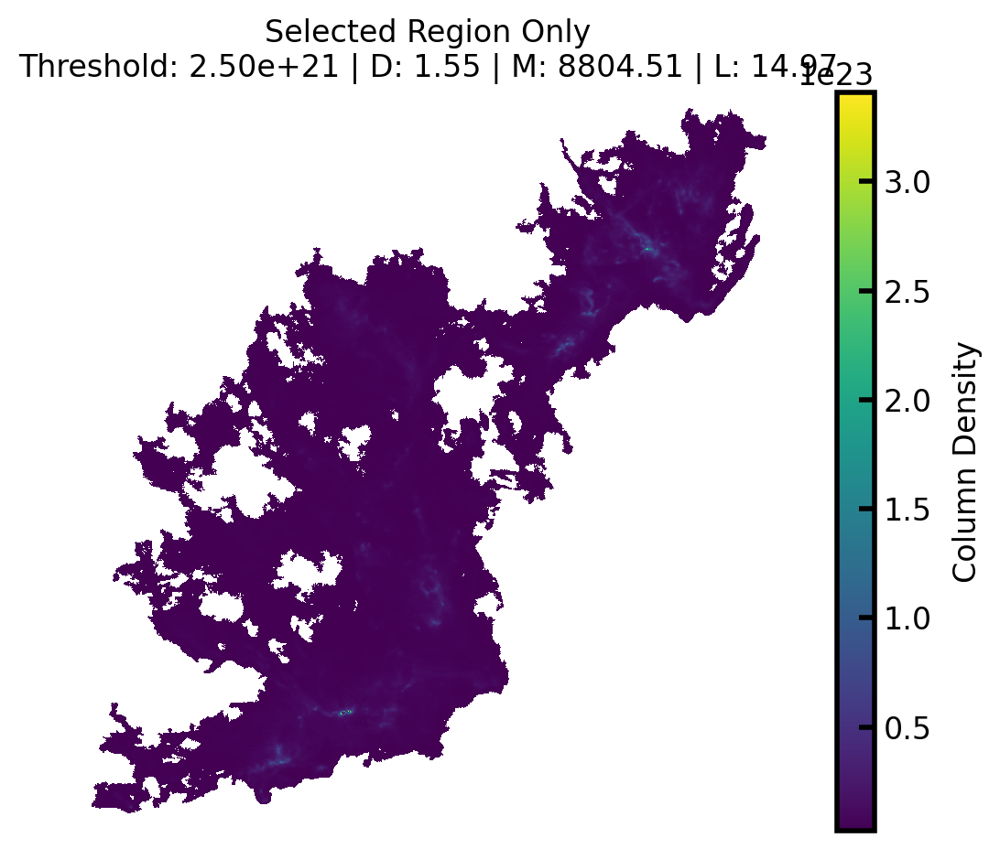

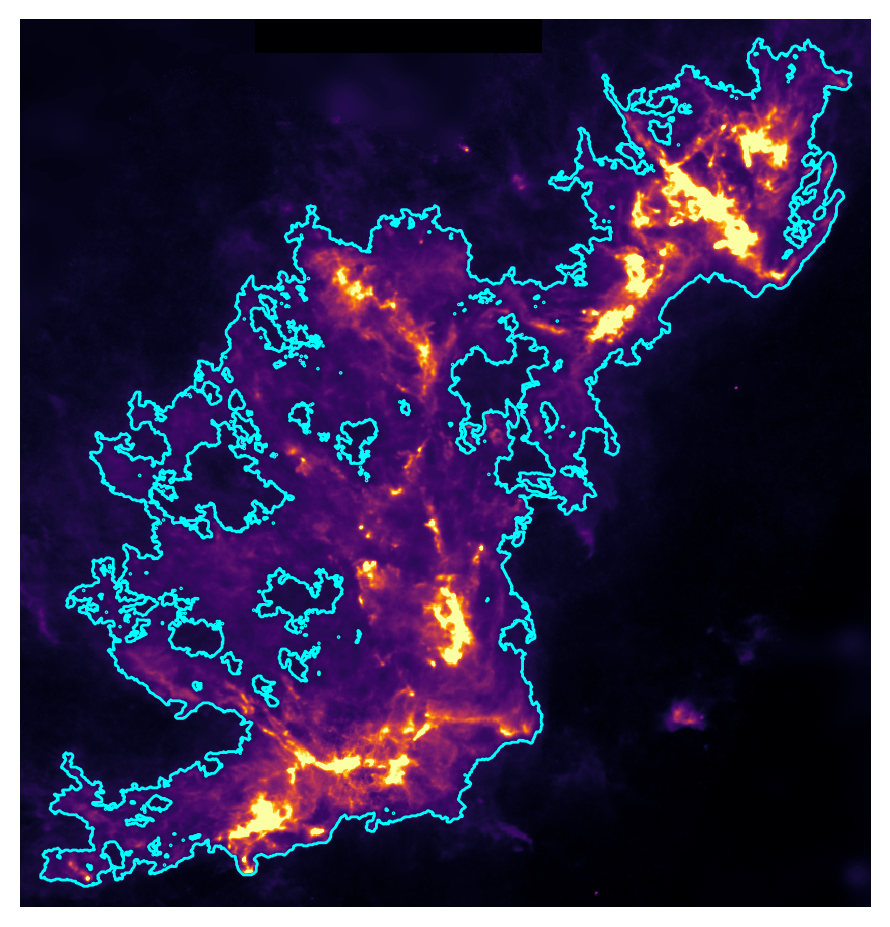

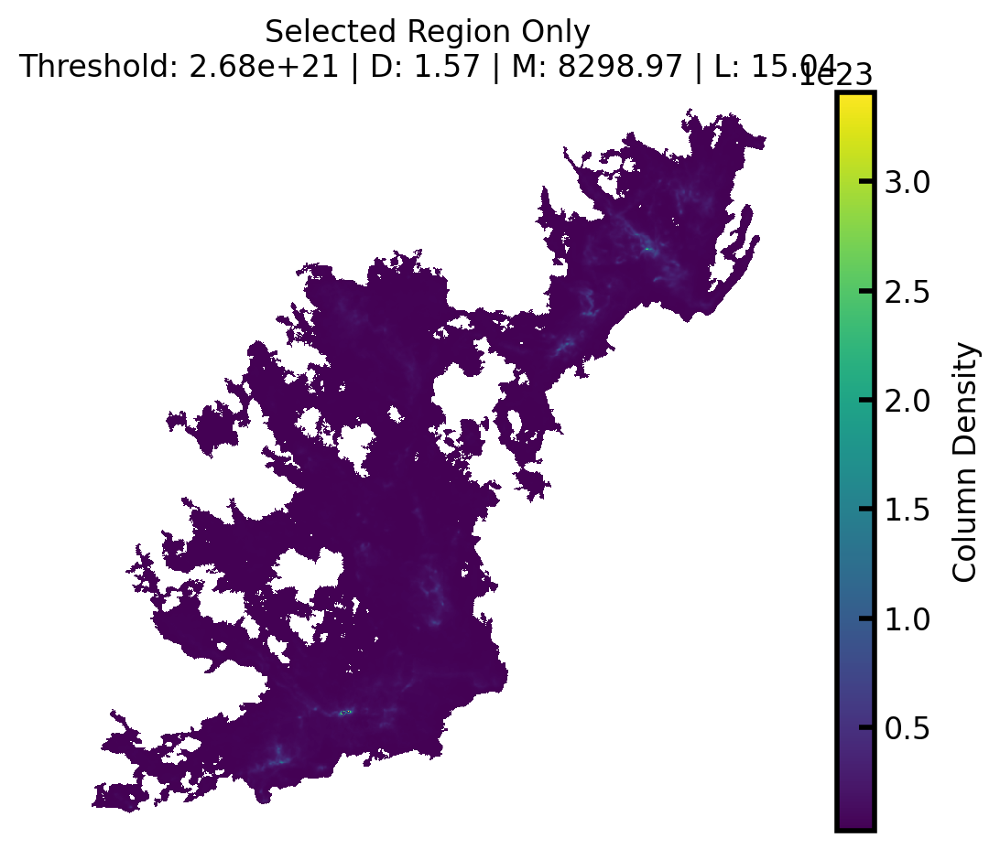

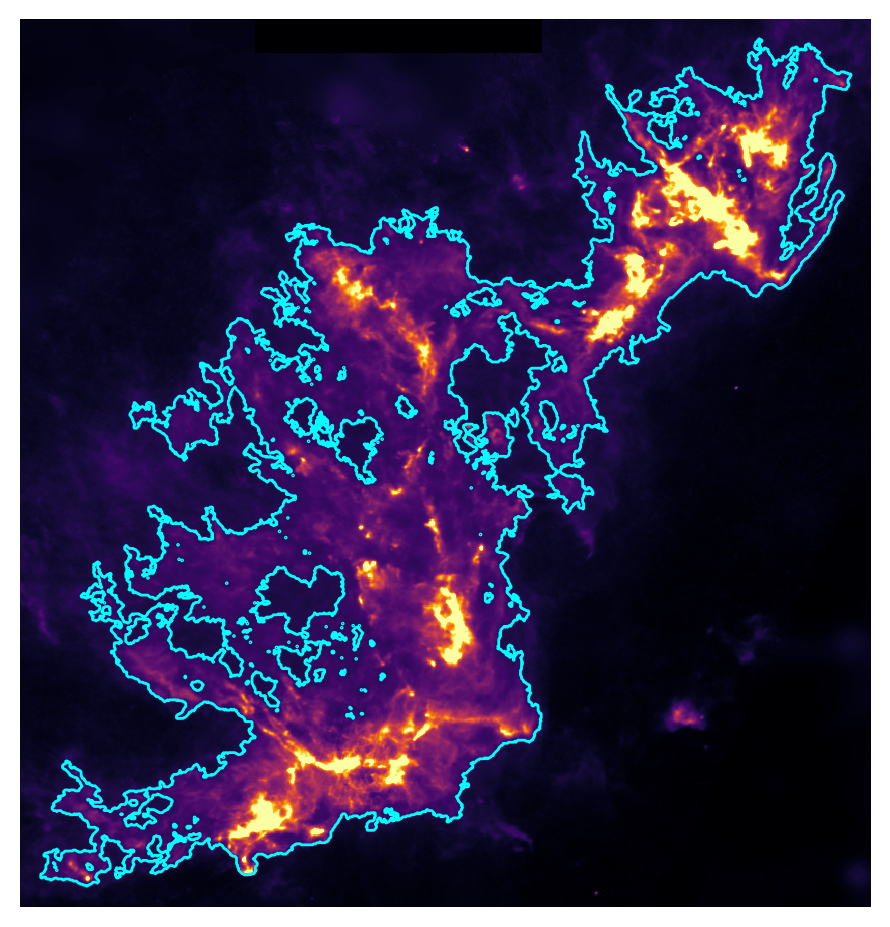

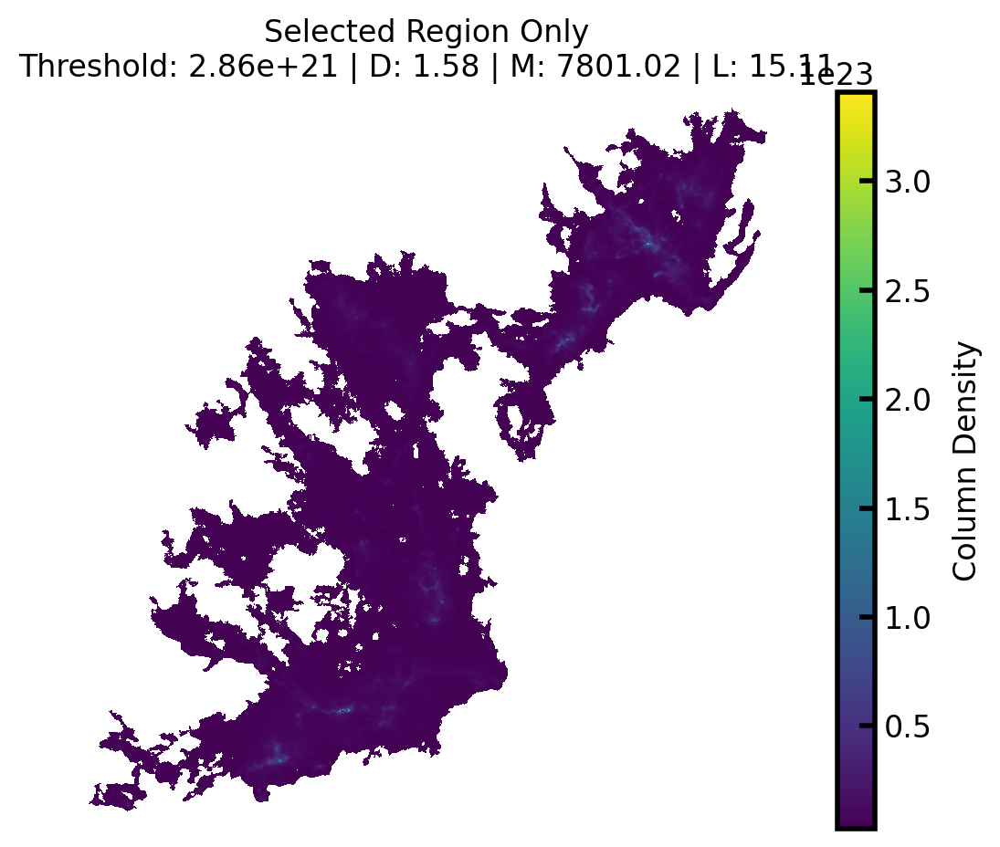

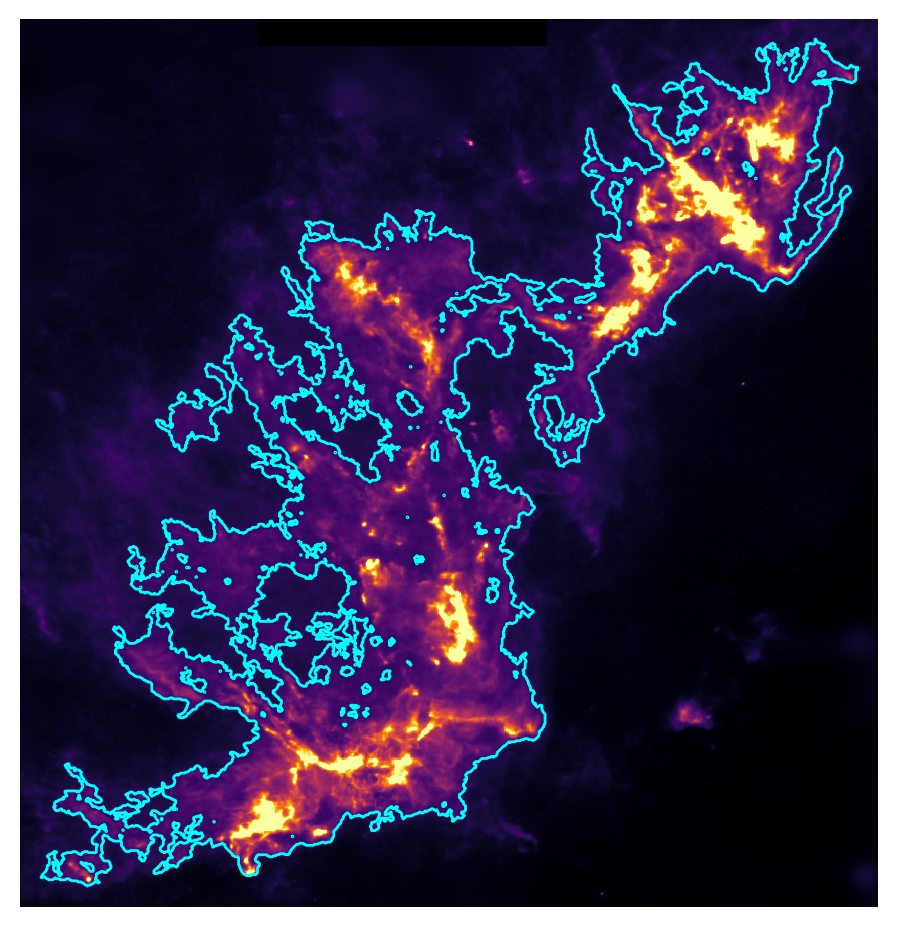

In [49]:
top_regions_data_OB = load_regions_from_pickle("top_regions_data_OB.pkl")
selected_regions_id = get_region_from_fractal_dimension_mass_and_size_NEW(
    top_regions_data_OB,
    fractal_dim=1.4,
    size=2*10,
    mass=8*10**3,
    fractal_tolerance=0.5,
    size_tolerance=10,
    mass_tolerance=1000
)

print(len(selected_regions_id))

for region_id in selected_regions_id:
    region_data = top_regions_data_OB[region_id]
    mask = region_data["region_mask"]

    # Get bounding box around region
    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    # Add padding to bounding box
    padding = 20  # pixels
    y_min = max(y_min - padding, 0)
    y_max = min(y_max + padding, N_H2_OB.shape[0])
    x_min = max(x_min - padding, 0)
    x_max = min(x_max + padding, N_H2_OB.shape[1])

    # Crop map and mask
    cropped_map = N_H2_OB[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # Masked region only
    masked_region = np.where(cropped_mask, cropped_map, np.nan)

    # Plot 1: Region alone
    plt.imshow(masked_region, cmap='viridis')
    plt.title(f"Selected Region Only\nThreshold: {region_data['threshold']:.2e} | D: {region_data['fractal_dimension']:.2f} | M: {region_data['mass']:.2f} | L: {region_data['size']:.2f}")
    plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

    min_value = np.percentile(cropped_map, 2)  # 2nd percentile
    max_value = np.percentile(cropped_map, 99)  # 98th percentile

    # Plot 2: Overlay region on full cropped map
    plt.imshow(cropped_map, vmin=min_value, vmax=max_value, cmap='inferno')
    plt.contour(cropped_mask, colors='cyan', linewidths=1)
    # plt.title("Region Overlay on Cropped Map", fontweight='bold')
    # plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

13


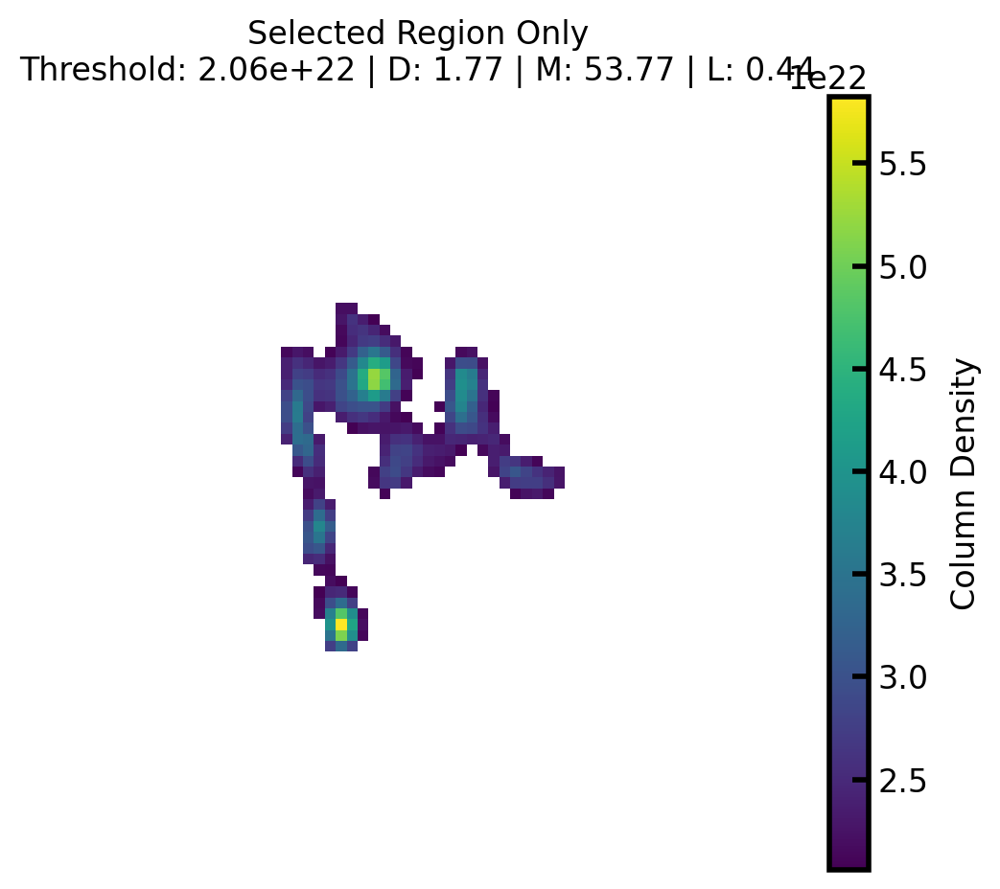

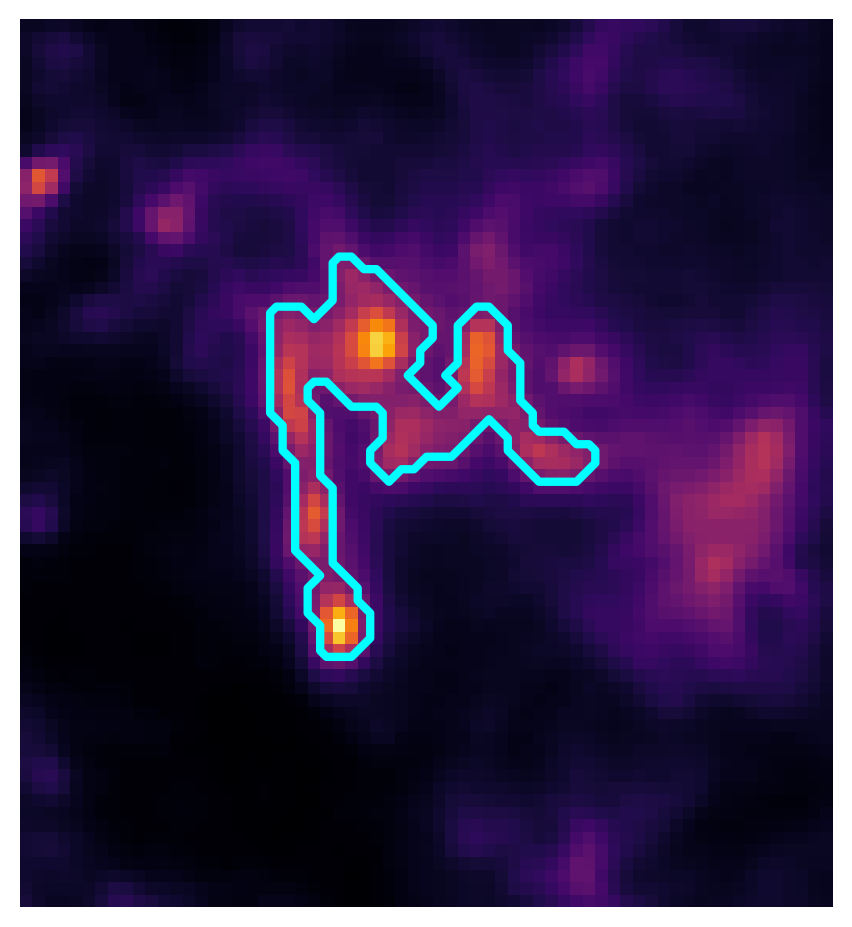

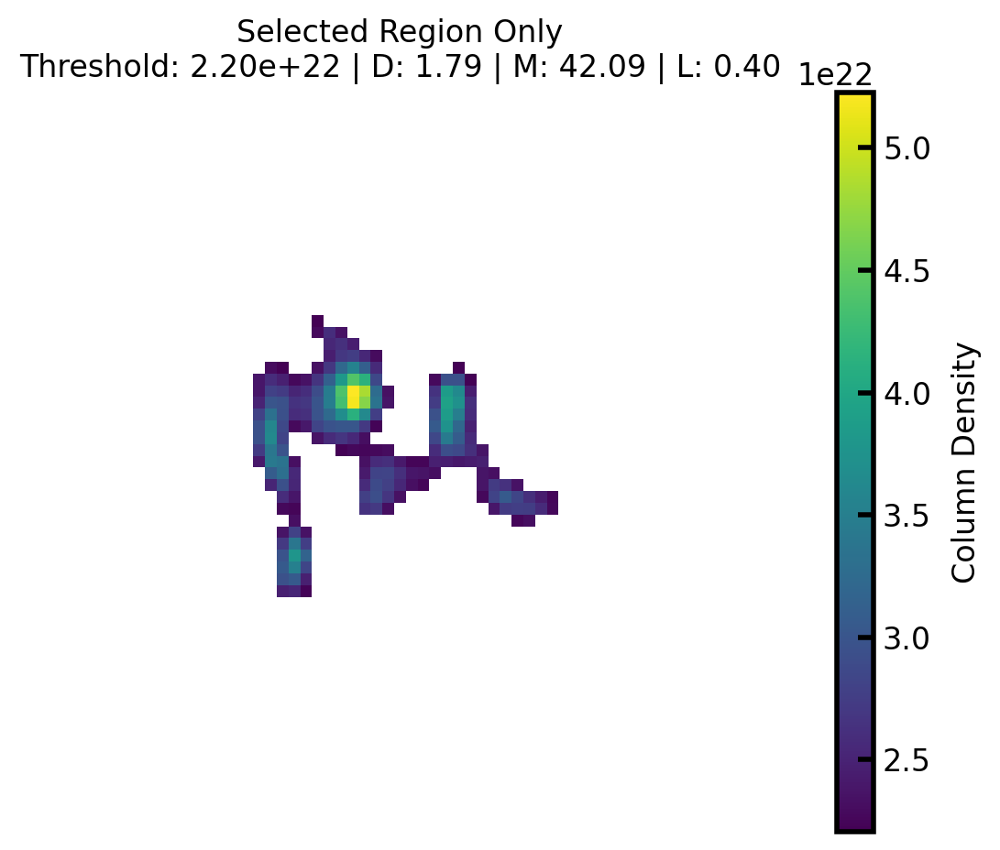

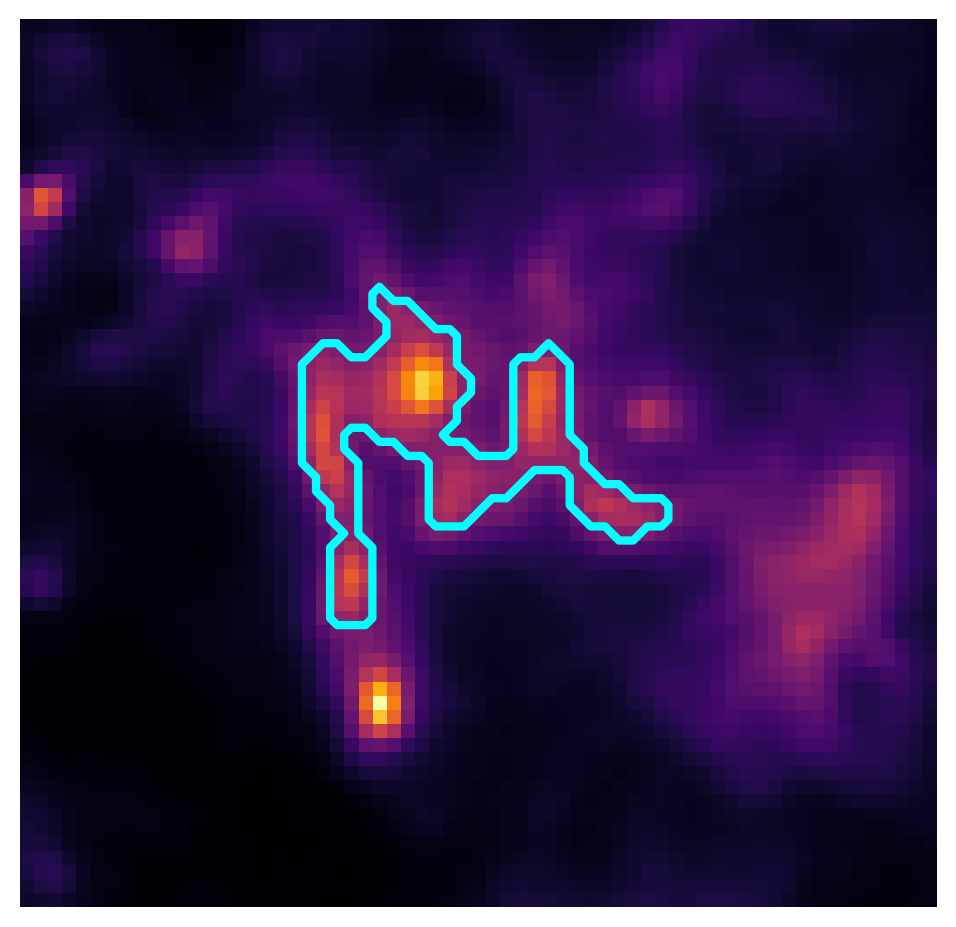

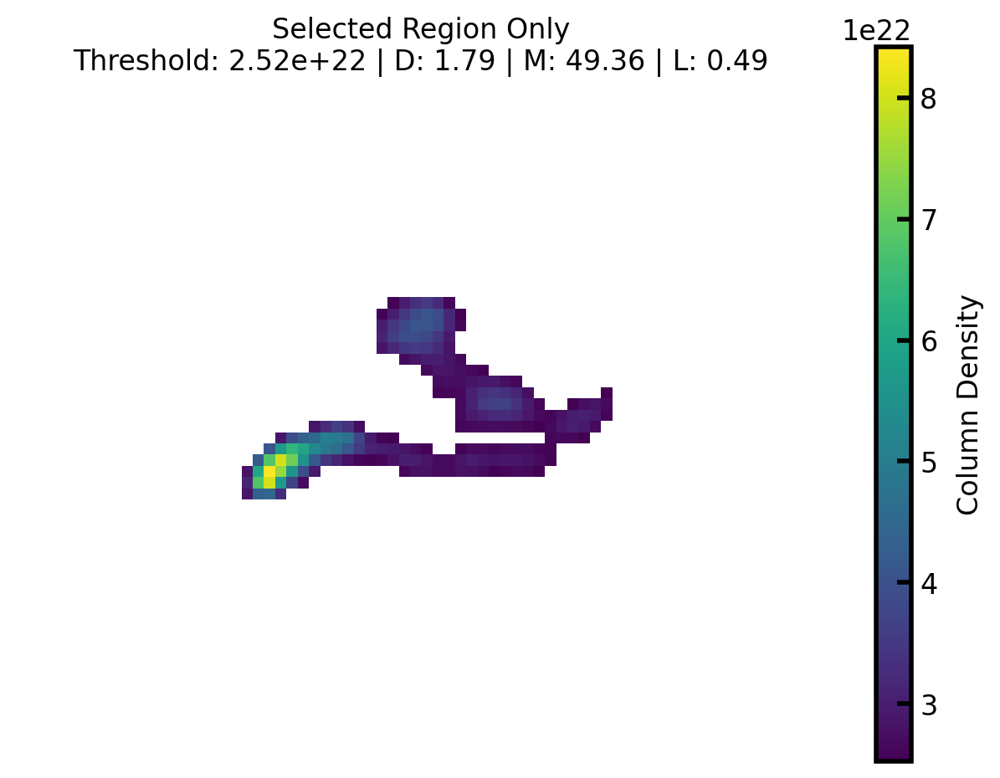

...

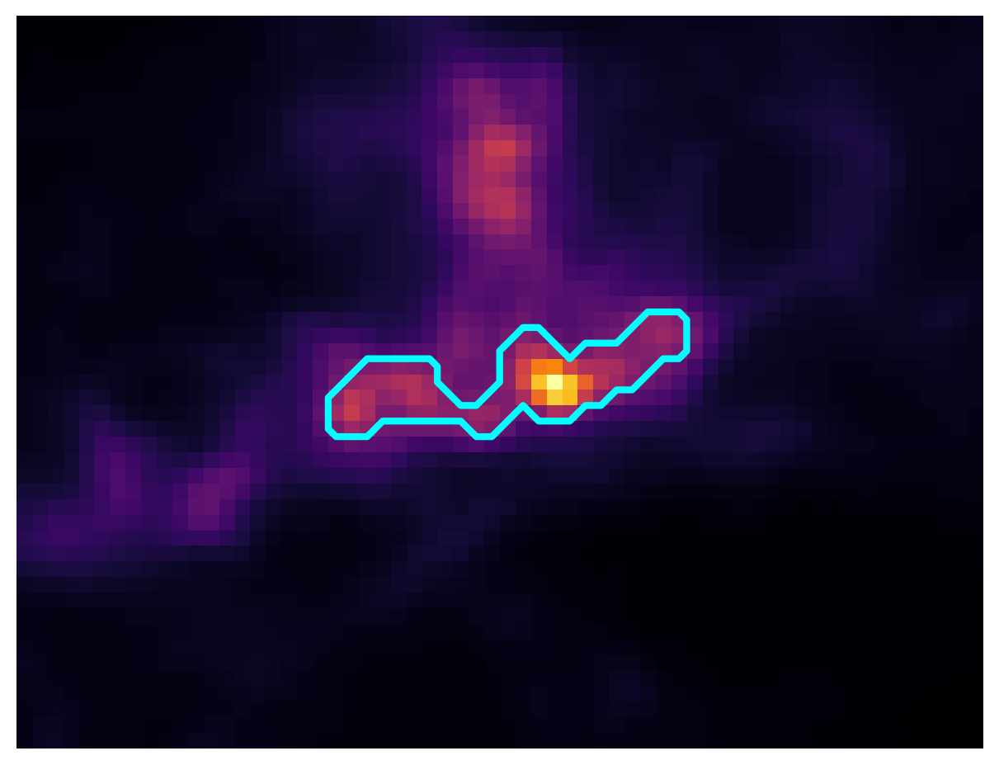

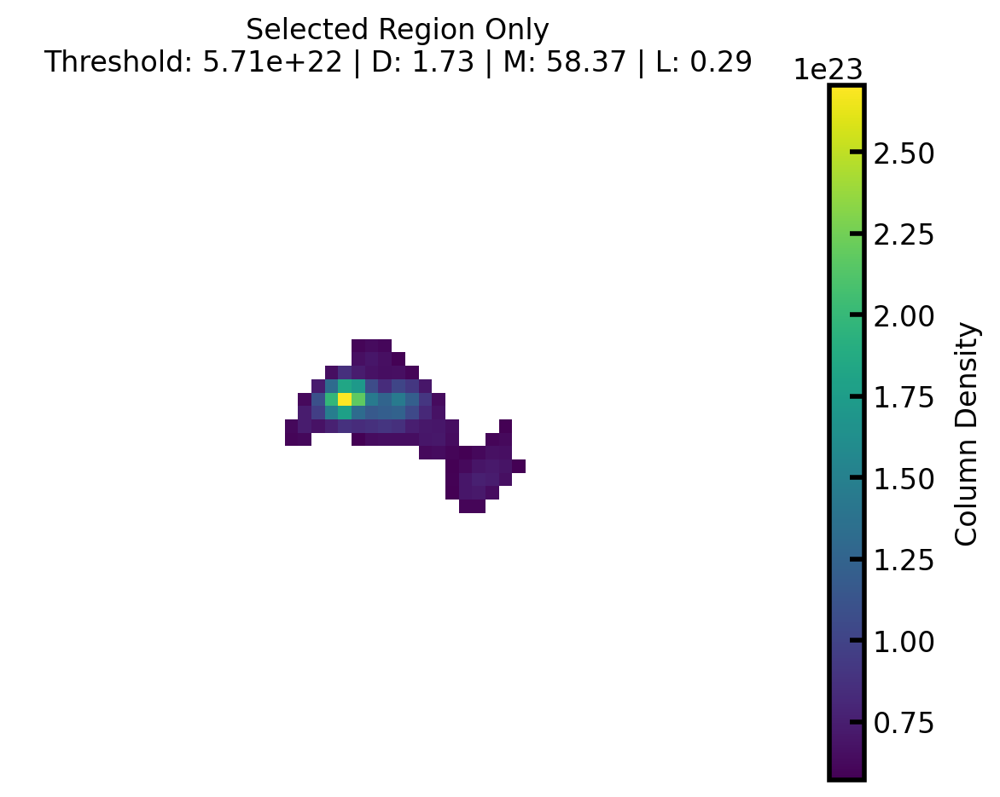

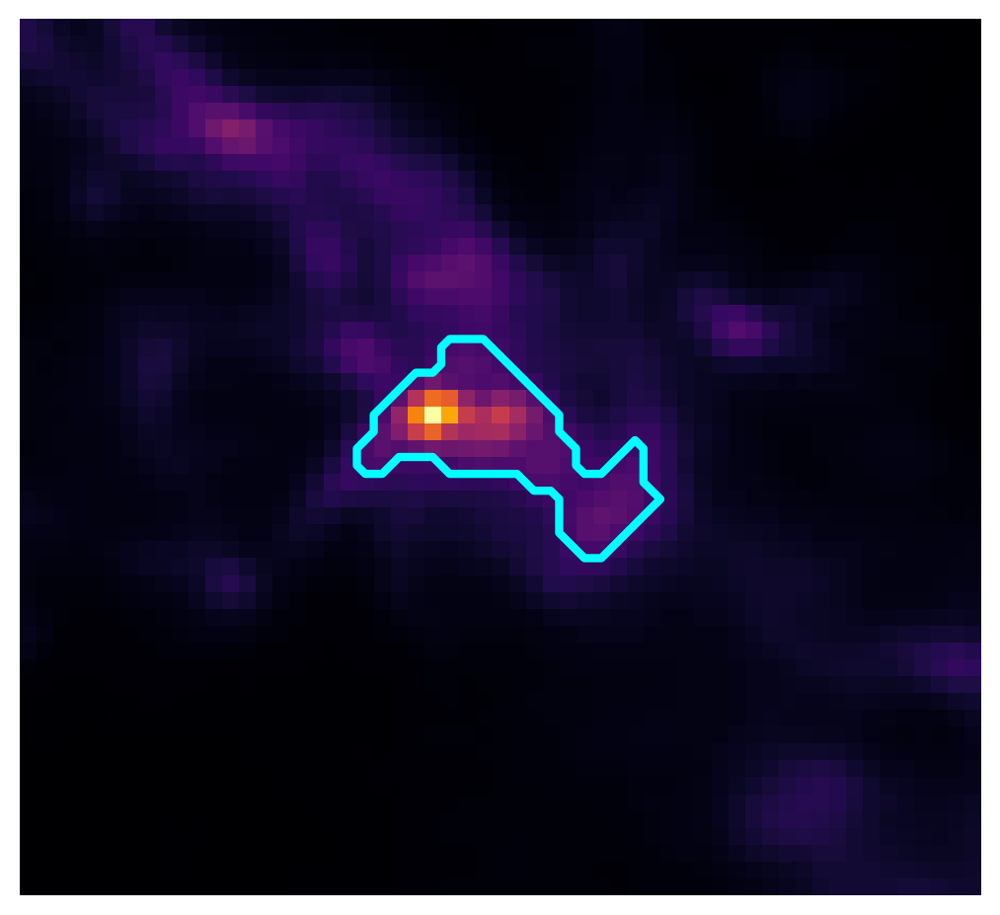

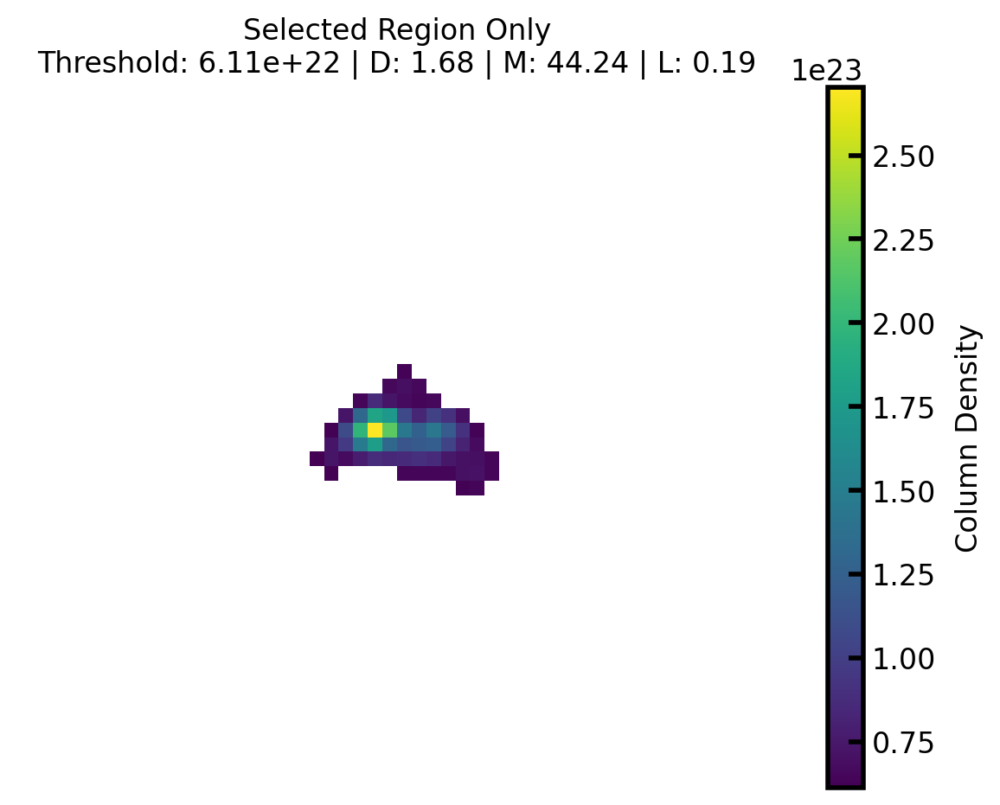

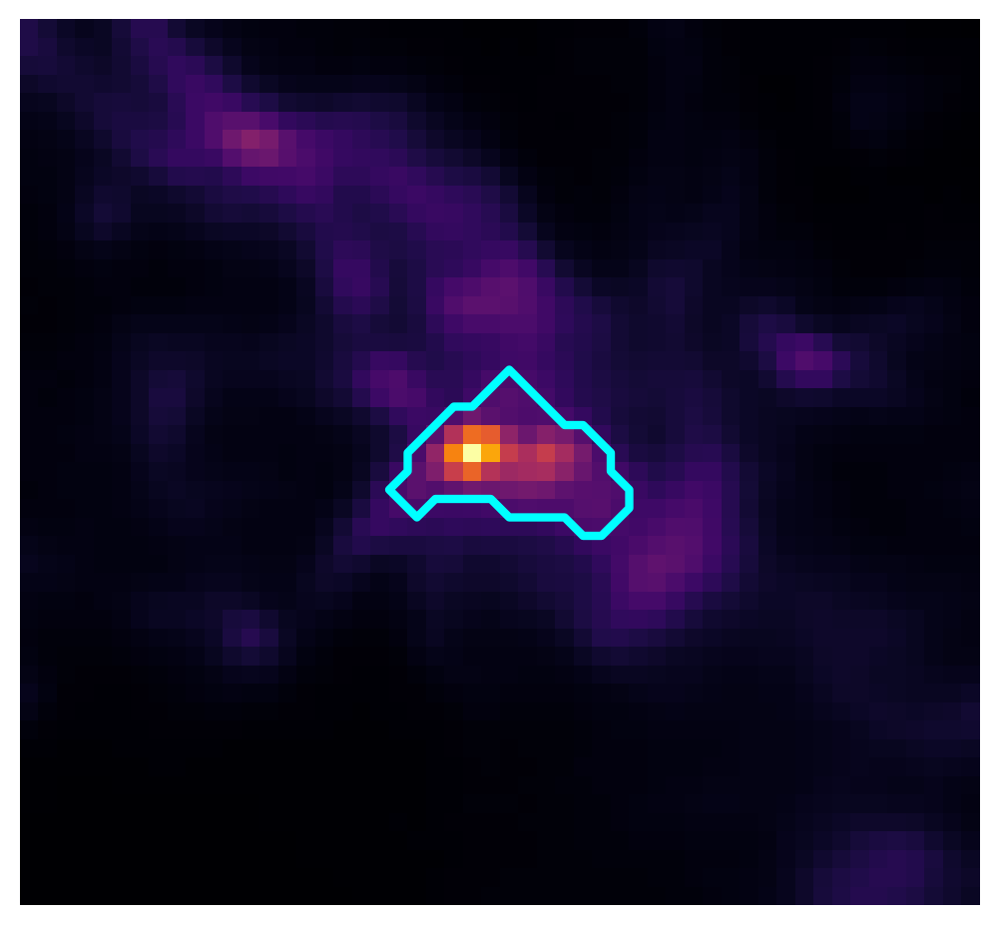

In [54]:
top_regions_data_OB = load_regions_from_pickle("top_regions_data_OB.pkl")
selected_regions_id = get_region_from_fractal_dimension_mass_and_size_NEW(
    top_regions_data_OB,
    fractal_dim=1.6,
    size=0.3,
    mass=50,
    fractal_tolerance=0.2,
    size_tolerance=0.2,
    mass_tolerance=10
)

print(len(selected_regions_id))

for region_id in selected_regions_id:
    region_data = top_regions_data_OB[region_id]
    mask = region_data["region_mask"]

    # Get bounding box around region
    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    # Add padding to bounding box
    padding = 20  # pixels
    y_min = max(y_min - padding, 0)
    y_max = min(y_max + padding, N_H2_OB.shape[0])
    x_min = max(x_min - padding, 0)
    x_max = min(x_max + padding, N_H2_OB.shape[1])

    # Crop map and mask
    cropped_map = N_H2_OB[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # Masked region only
    masked_region = np.where(cropped_mask, cropped_map, np.nan)

    # Plot 1: Region alone
    plt.imshow(masked_region, cmap='viridis')
    plt.title(f"Selected Region Only\nThreshold: {region_data['threshold']:.2e} | D: {region_data['fractal_dimension']:.2f} | M: {region_data['mass']:.2f} | L: {region_data['size']:.2f}")
    plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

    # Plot 2: Overlay region on full cropped map
    plt.imshow(cropped_map, cmap='inferno')
    plt.contour(cropped_mask, colors='cyan', linewidths=3)
    # plt.title("Region Overlay on Cropped Map", fontweight='bold')
    # plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

Number of regions with threshold > 6e22: 12


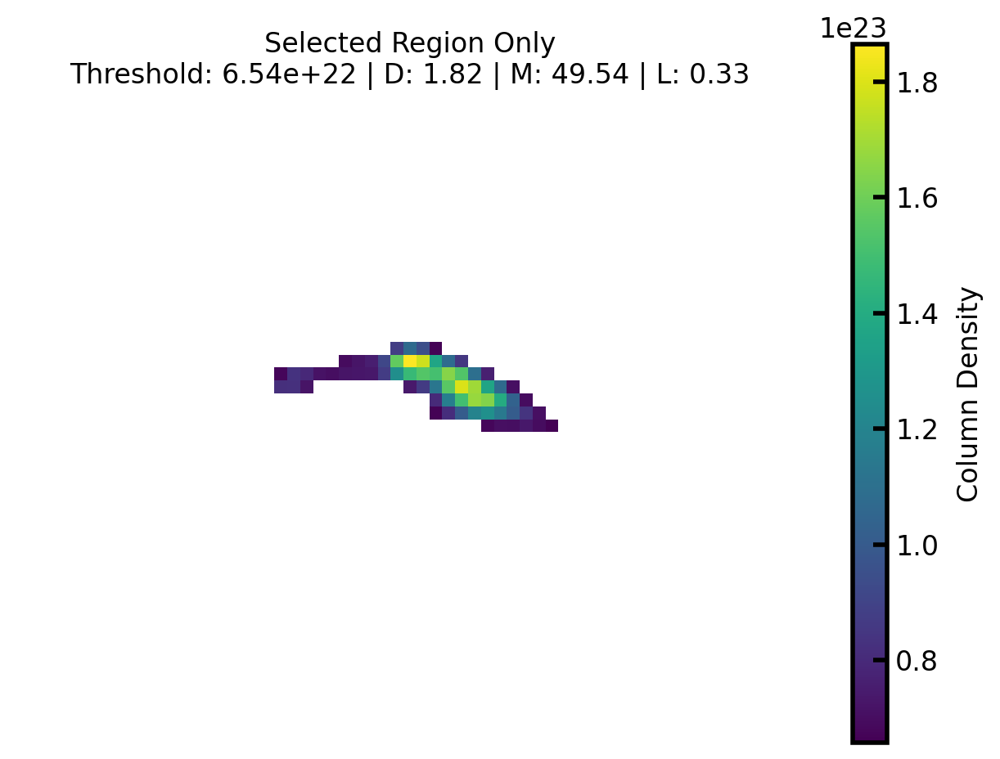

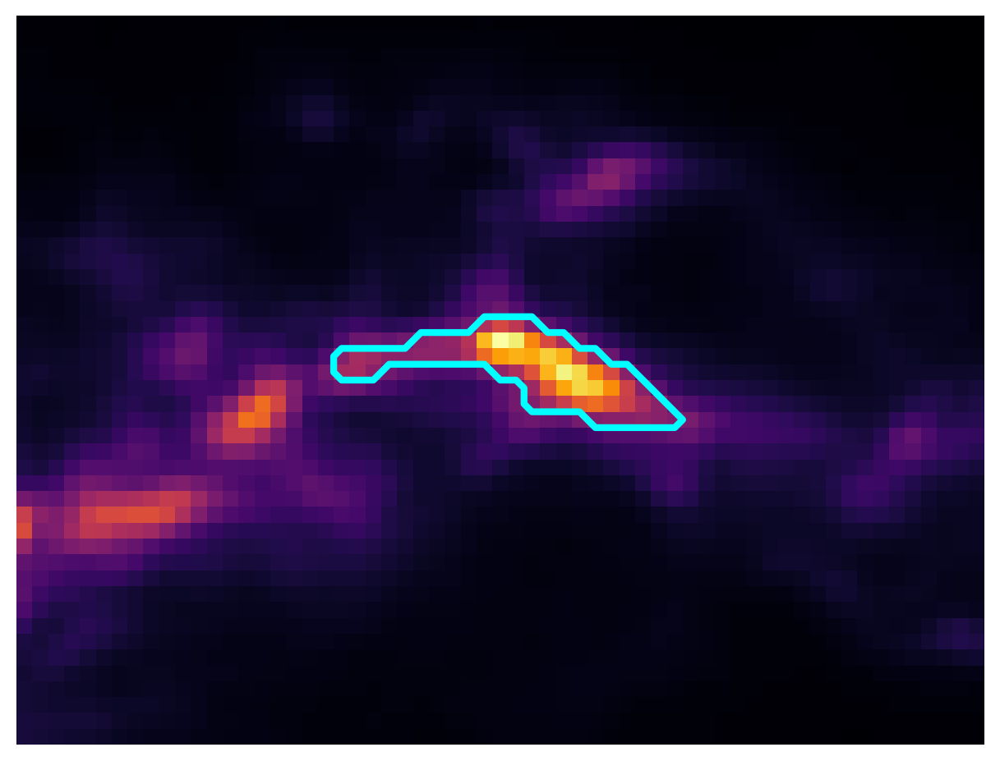

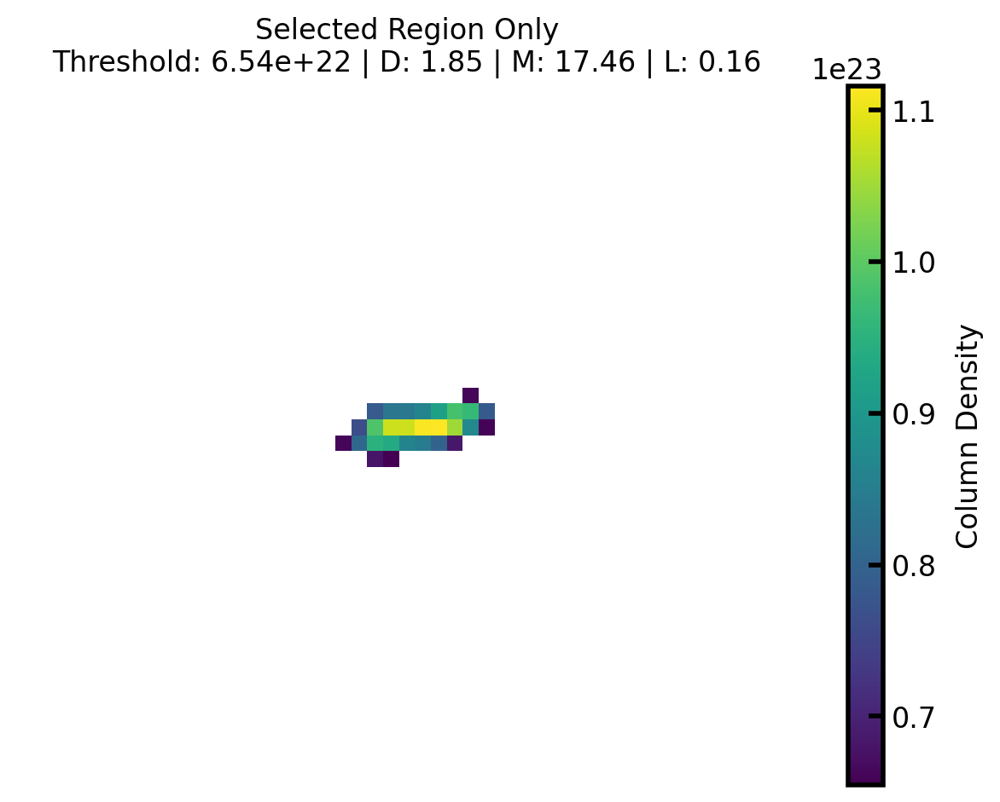

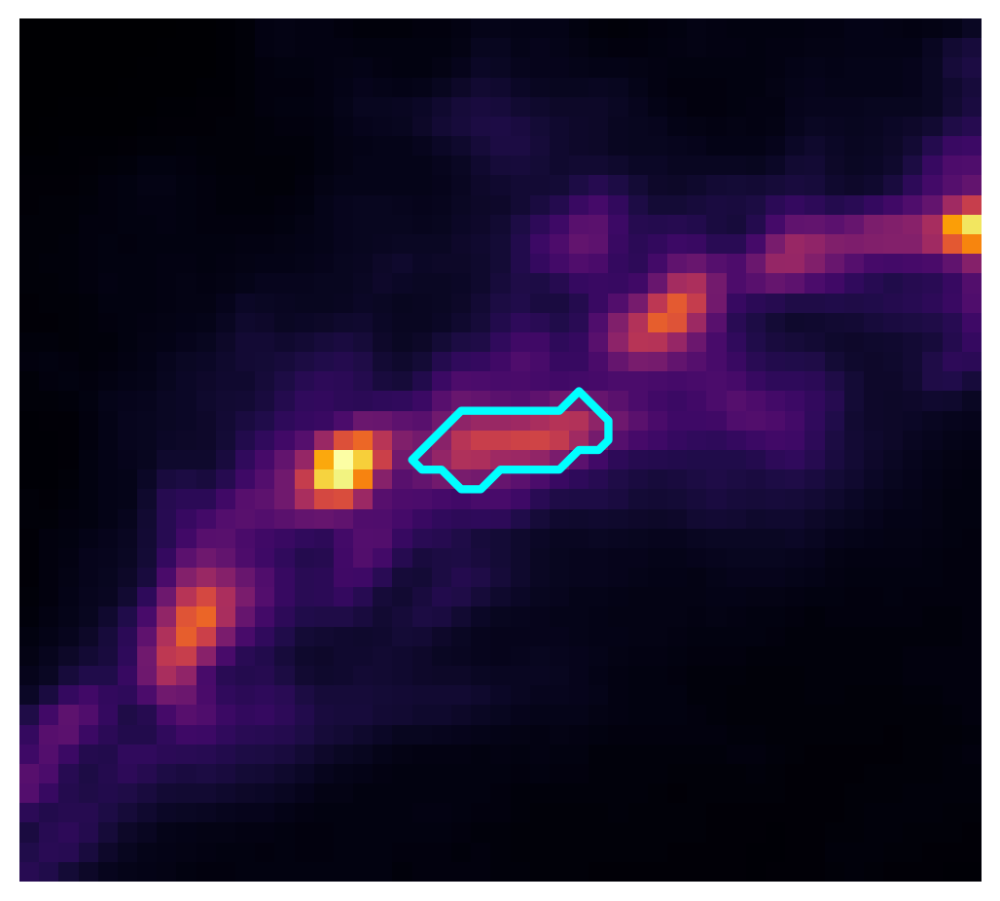

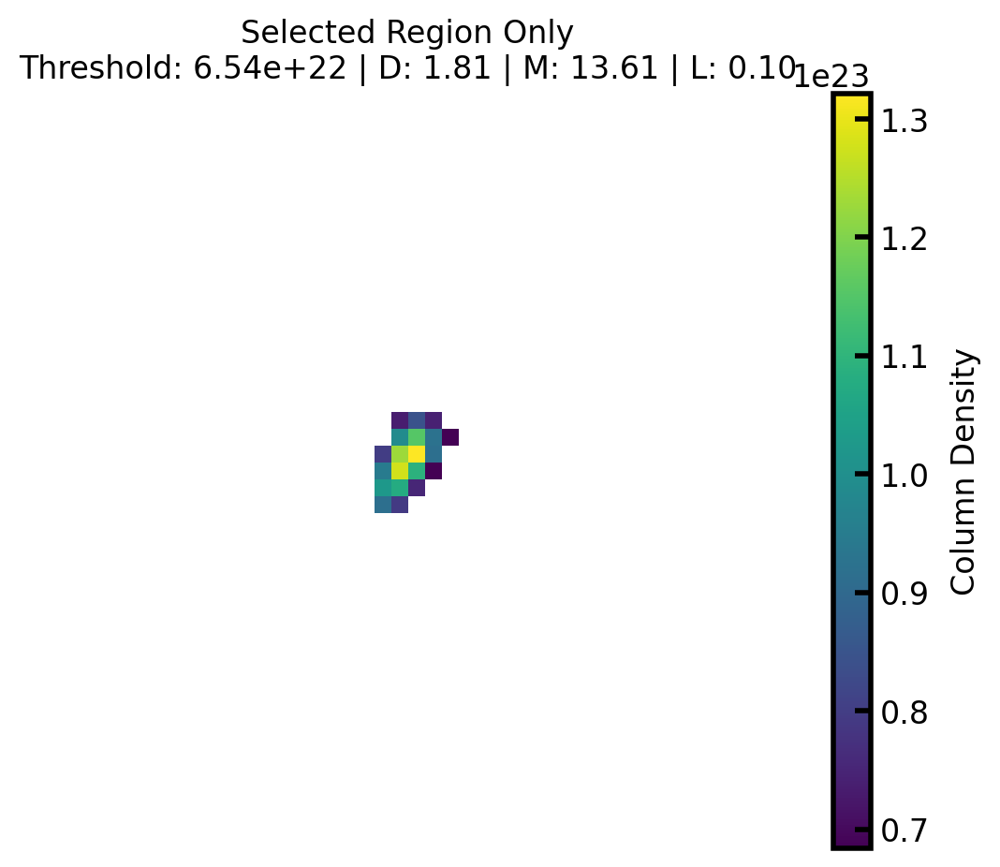

...

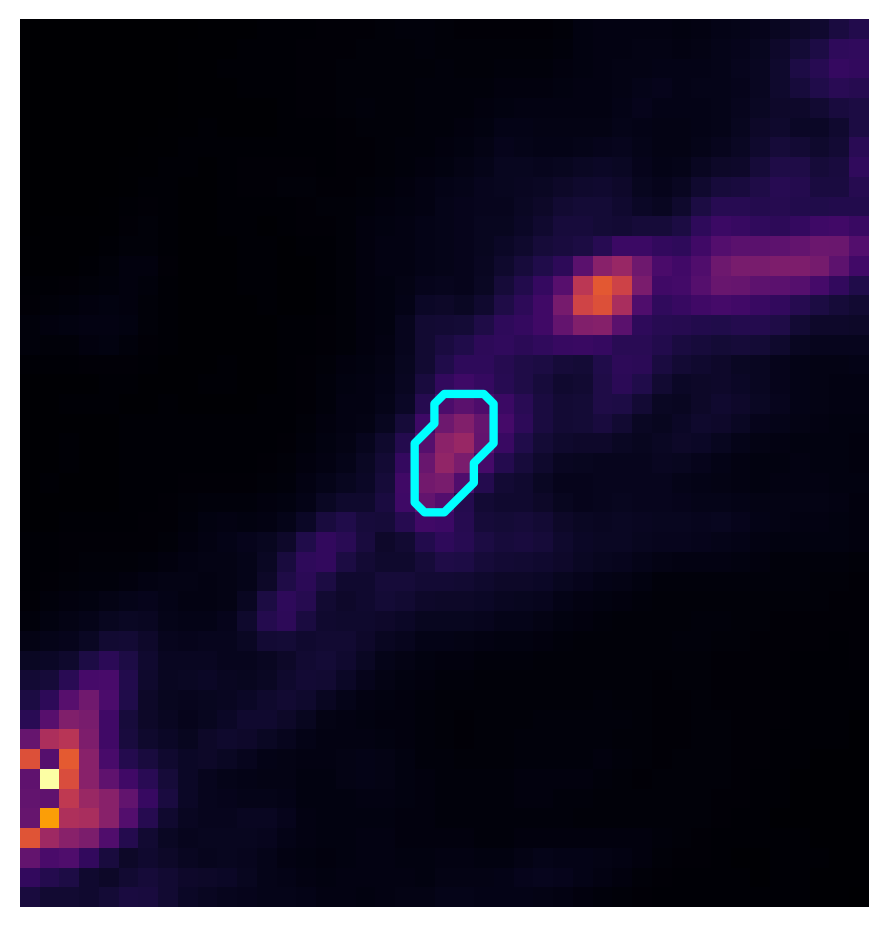

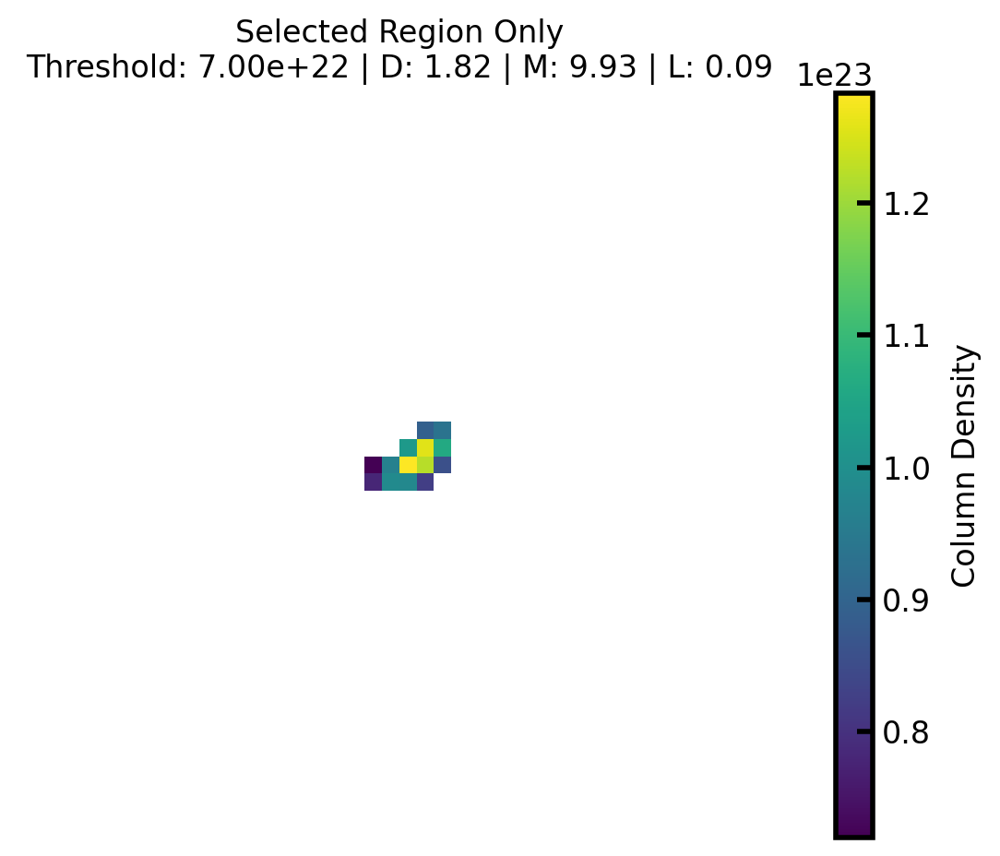

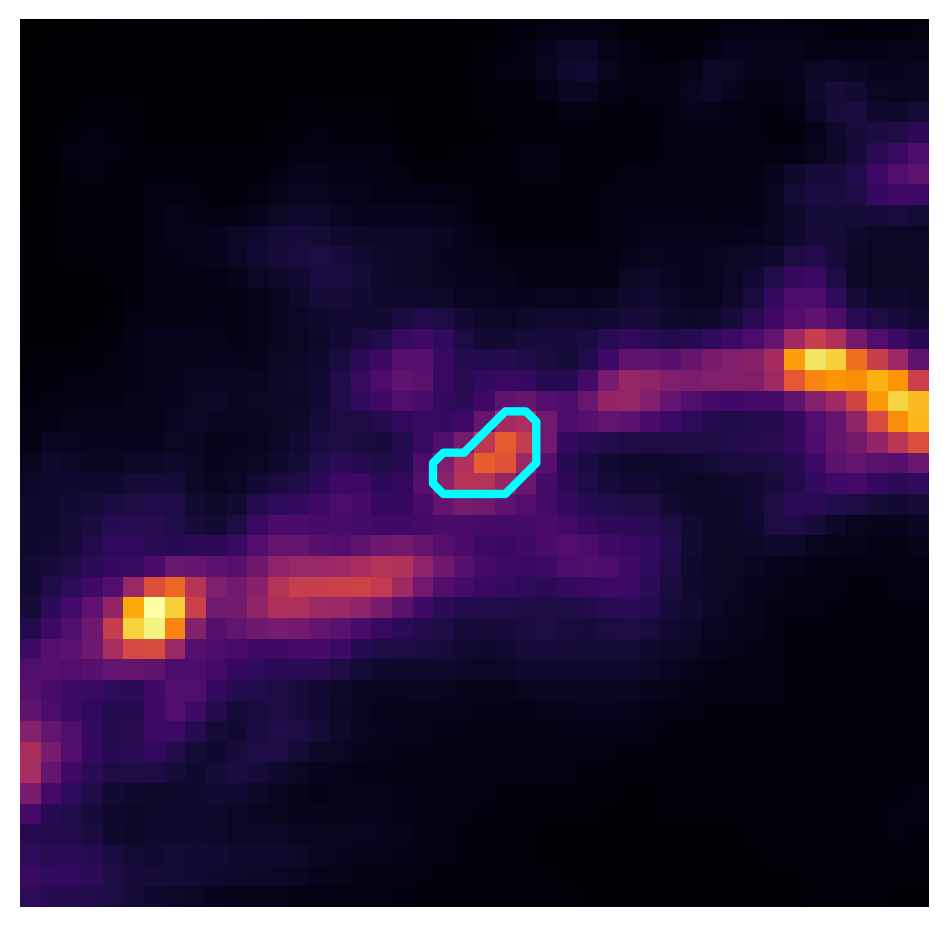

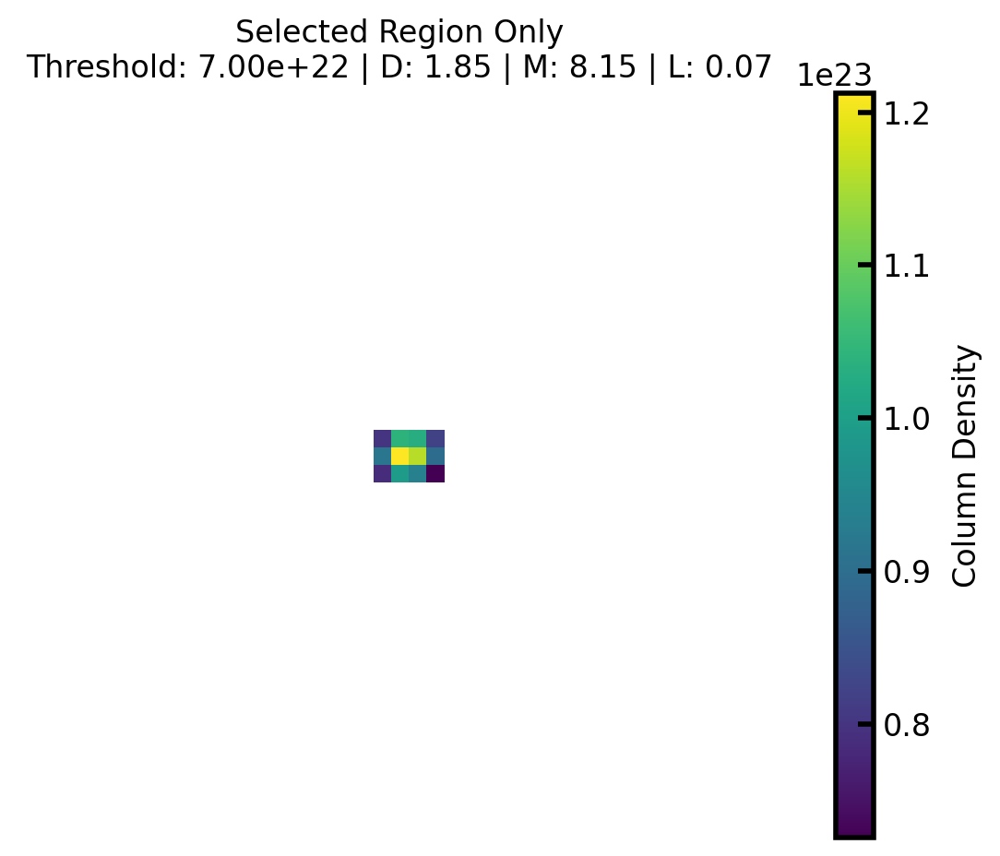

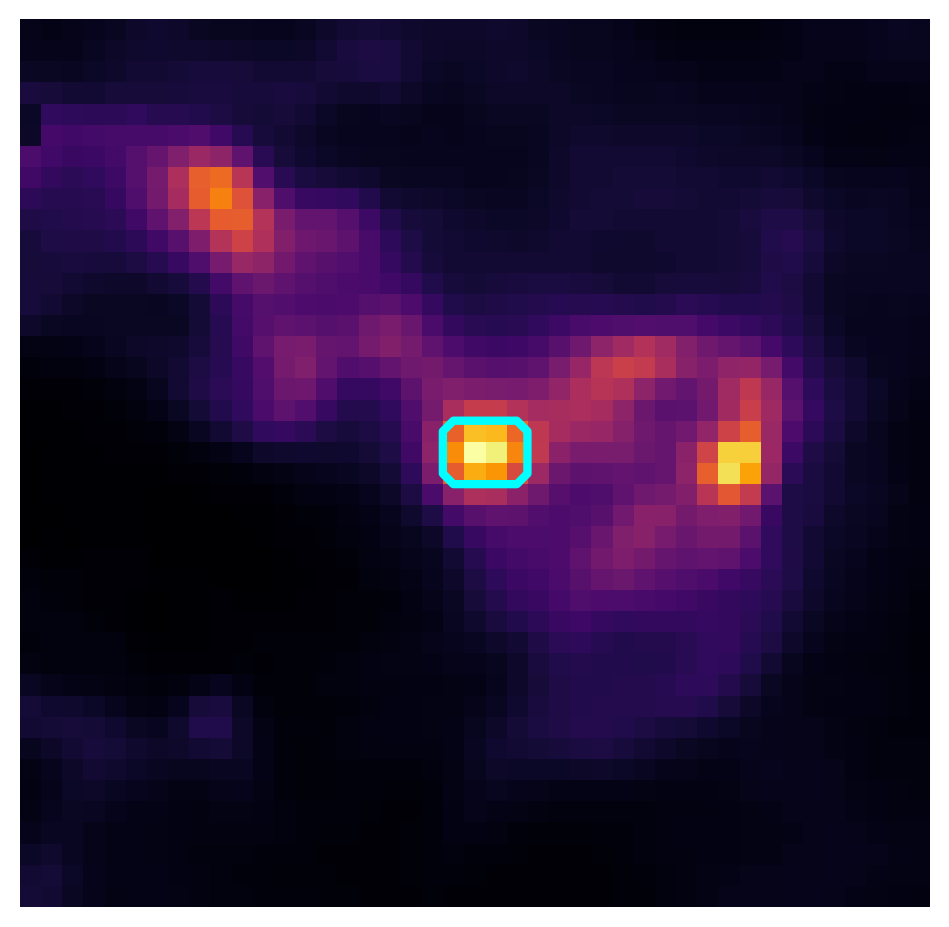

In [8]:
top_regions_data_OA = load_regions_from_pickle("top_regions_data_OA.pkl")

selected_regions = {
    region_id: data
    for region_id, data in top_regions_data_OA.items()
    if data["threshold"] > 6.5e22
    and data["fractal_dimension"] > 1.7
}

print(f"Number of regions with threshold > 6e22: {len(selected_regions)}")

for region_id in selected_regions:
    region_data = top_regions_data_OA[region_id]
    mask = region_data["region_mask"]

    # Get bounding box around region
    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    # Add padding to bounding box
    padding = 20  # pixels
    y_min = max(y_min - padding, 0)
    y_max = min(y_max + padding, N_H2_OA.shape[0])
    x_min = max(x_min - padding, 0)
    x_max = min(x_max + padding, N_H2_OA.shape[1])

    # Crop map and mask
    cropped_map = N_H2_OA[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # Masked region only
    masked_region = np.where(cropped_mask, cropped_map, np.nan)

    # Plot 1: Region alone
    plt.imshow(masked_region, cmap='viridis')
    plt.title(f"Selected Region Only\nThreshold: {region_data['threshold']:.2e} | D: {region_data['fractal_dimension']:.2f} | M: {region_data['mass']:.2f} | L: {region_data['size']:.2f}")
    plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

    # Plot 2: Overlay region on full cropped map
    plt.imshow(cropped_map, cmap='inferno')
    plt.contour(cropped_mask, colors='cyan', linewidths=3)
    # plt.title("Region Overlay on Cropped Map", fontweight='bold')
    # plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

Number of regions with threshold > 6e22: 6


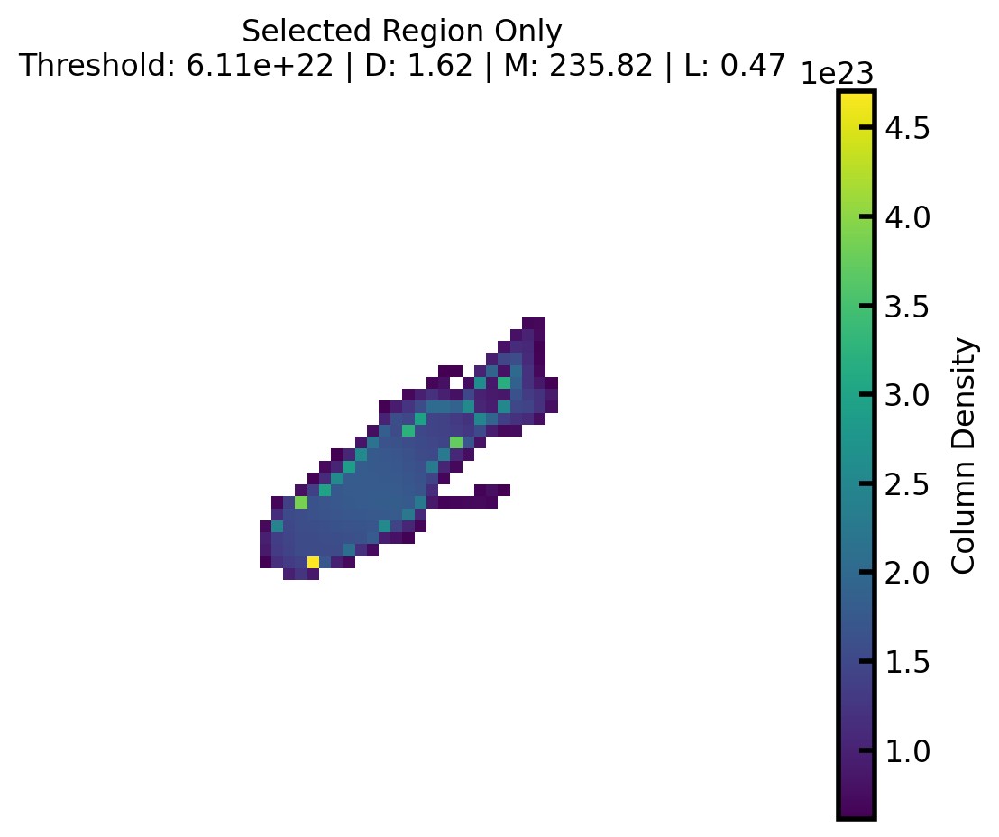

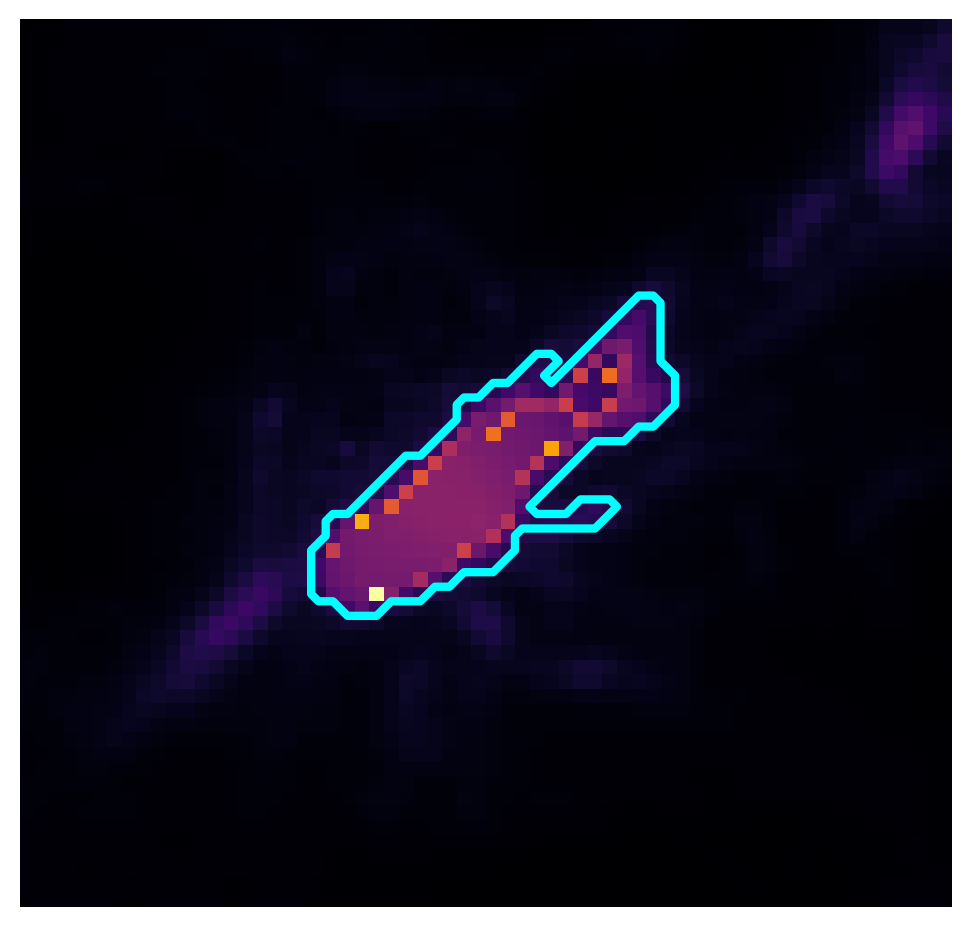

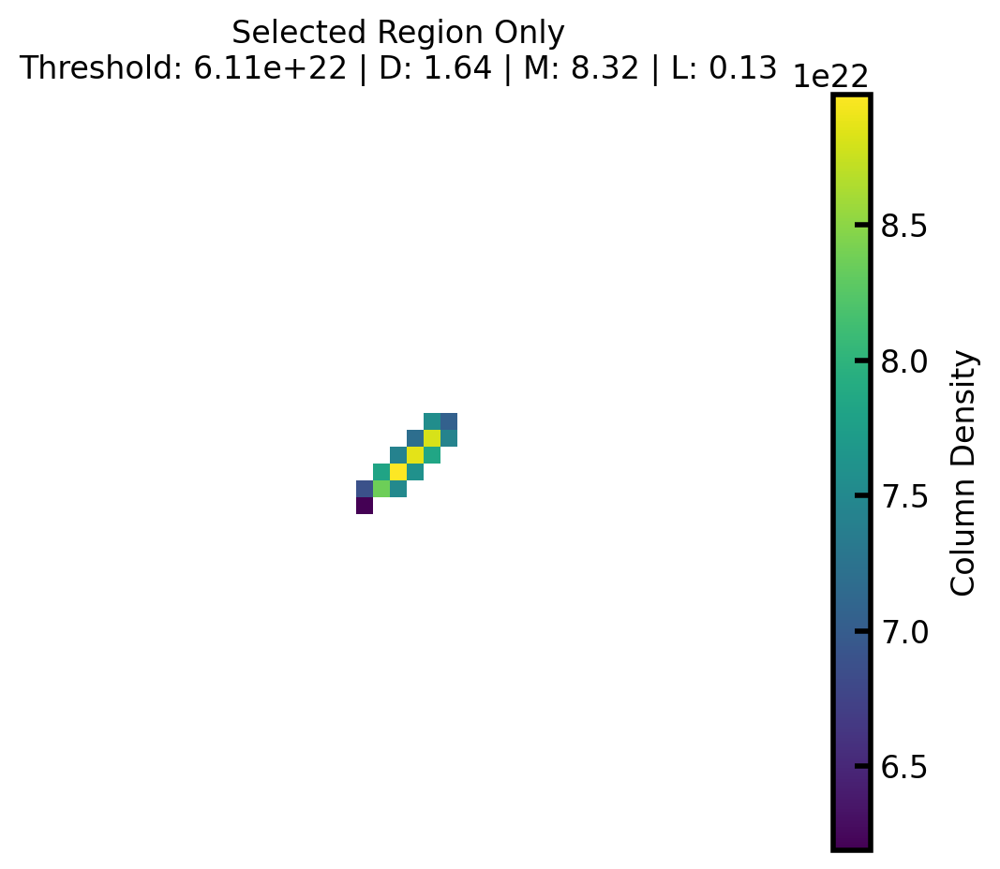

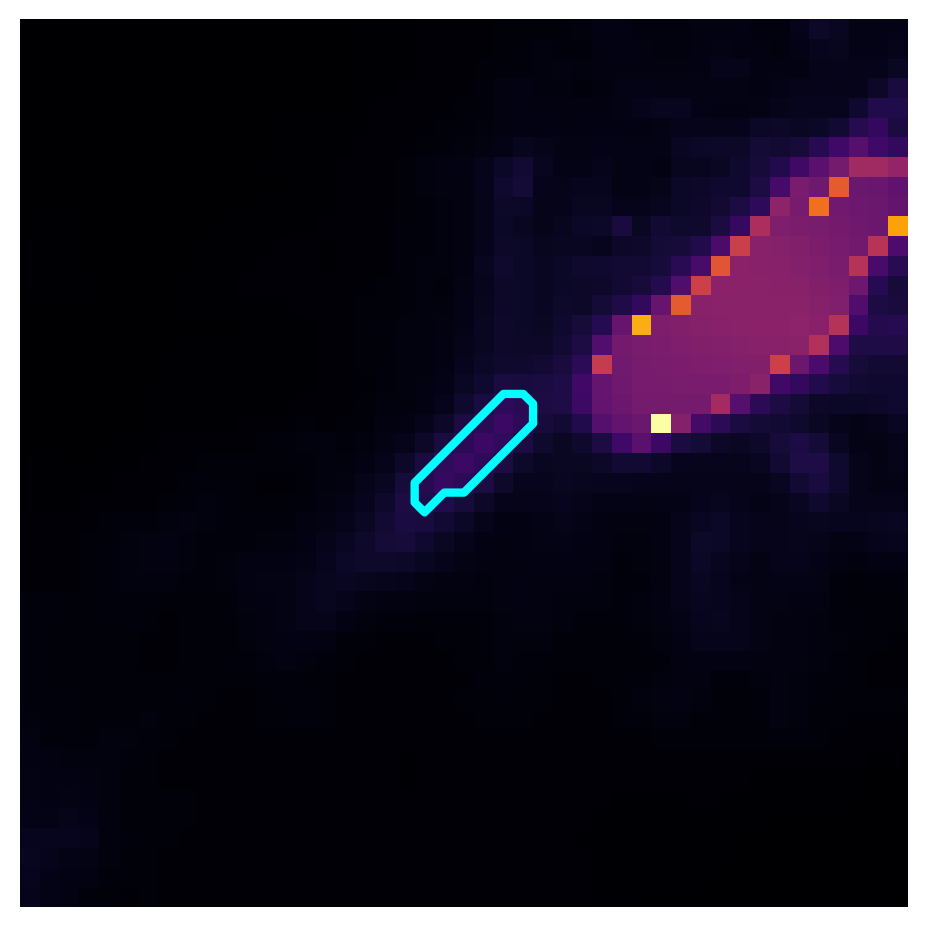

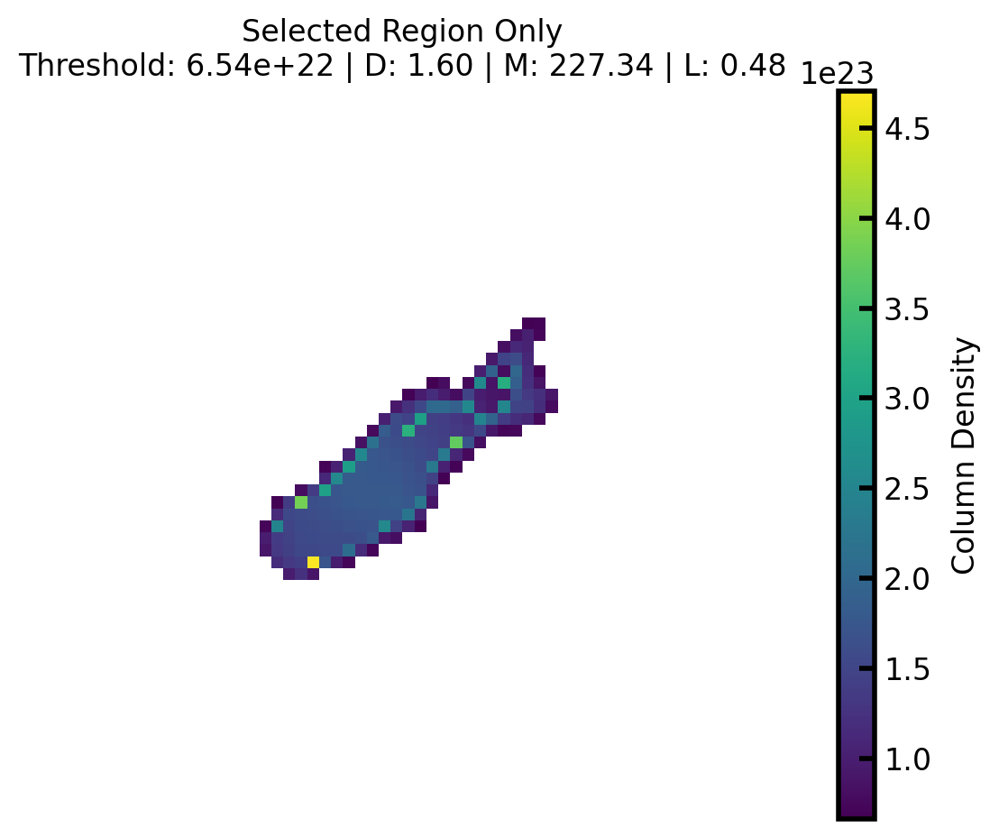

...

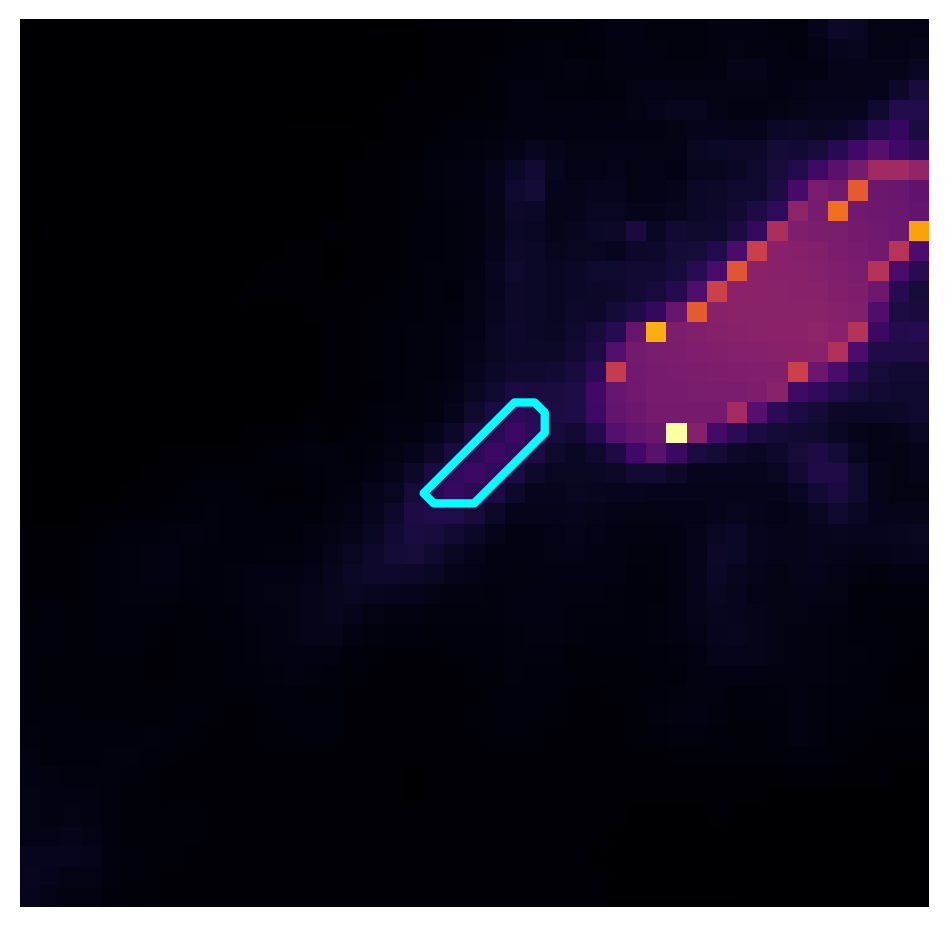

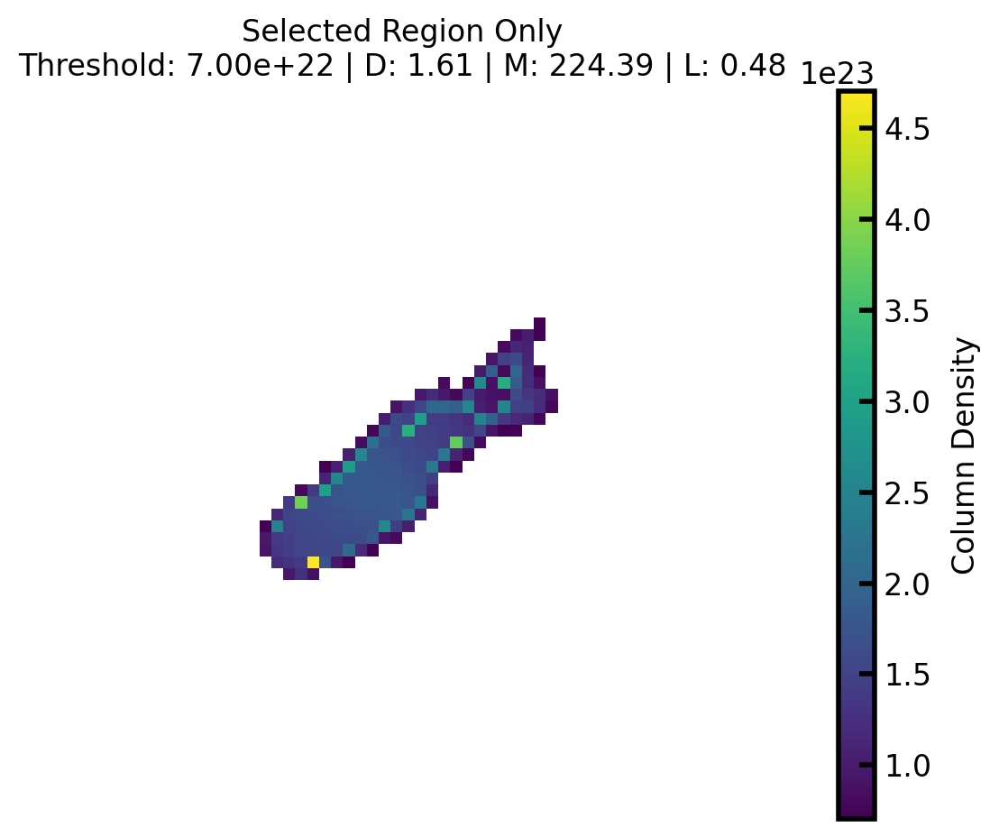

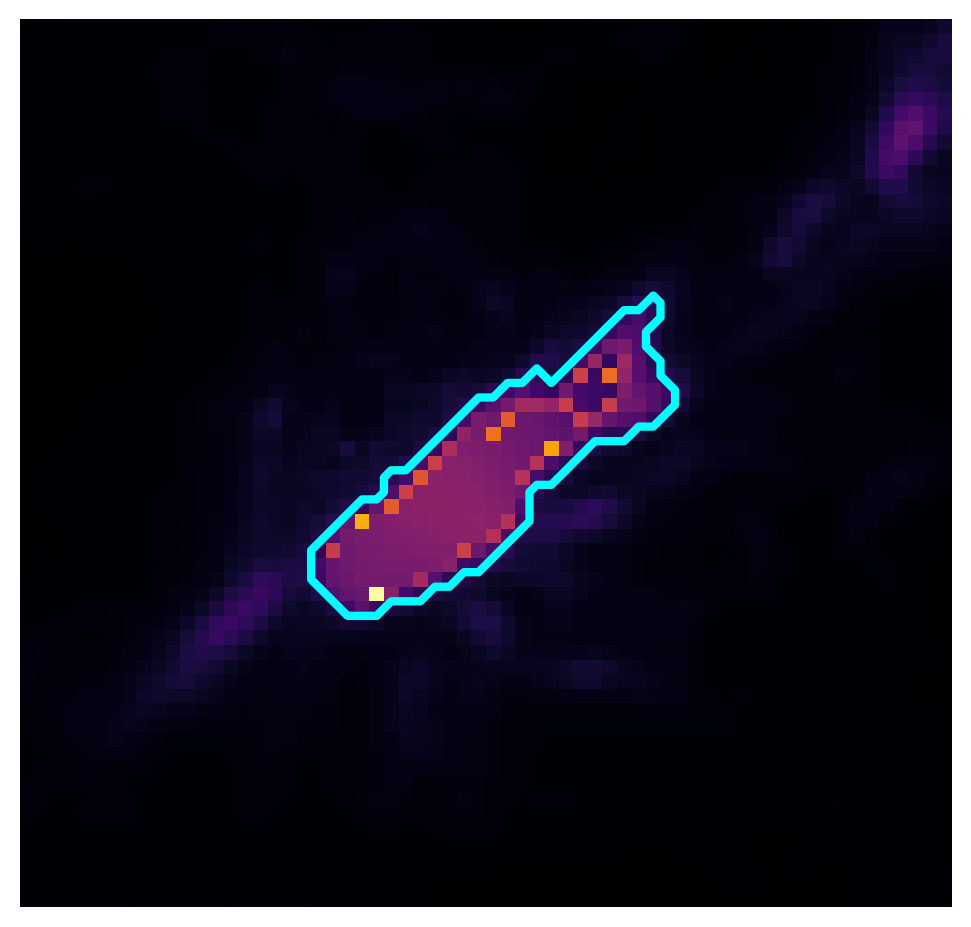

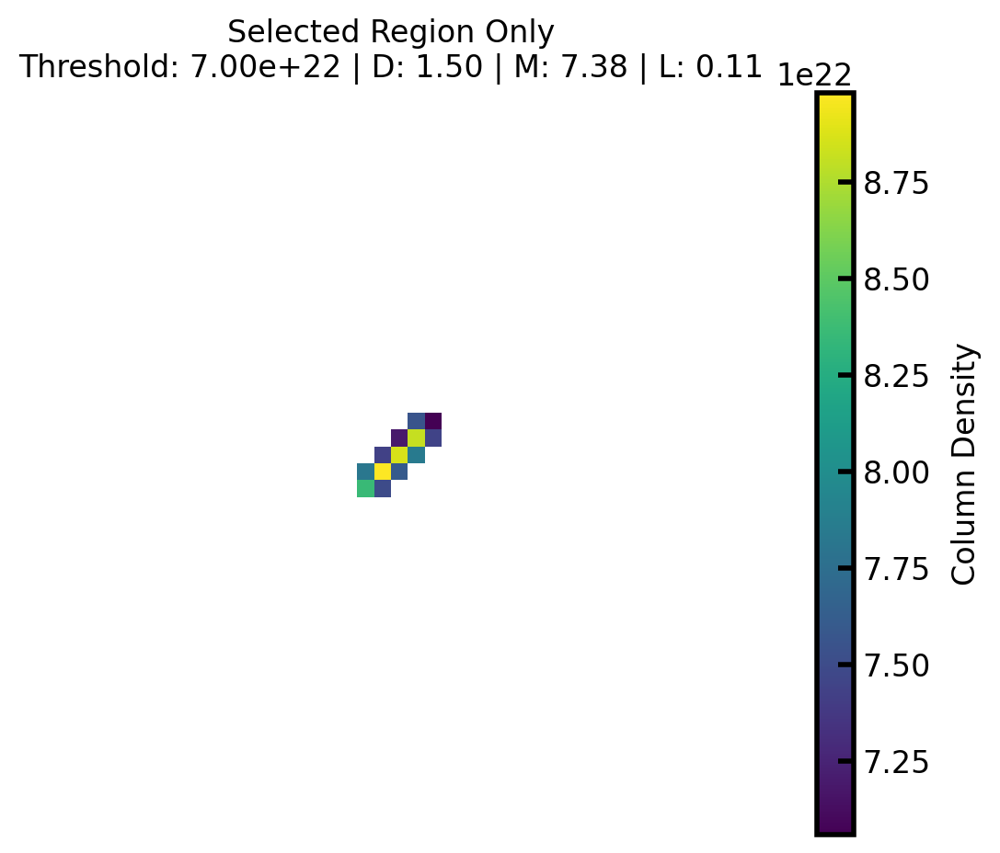

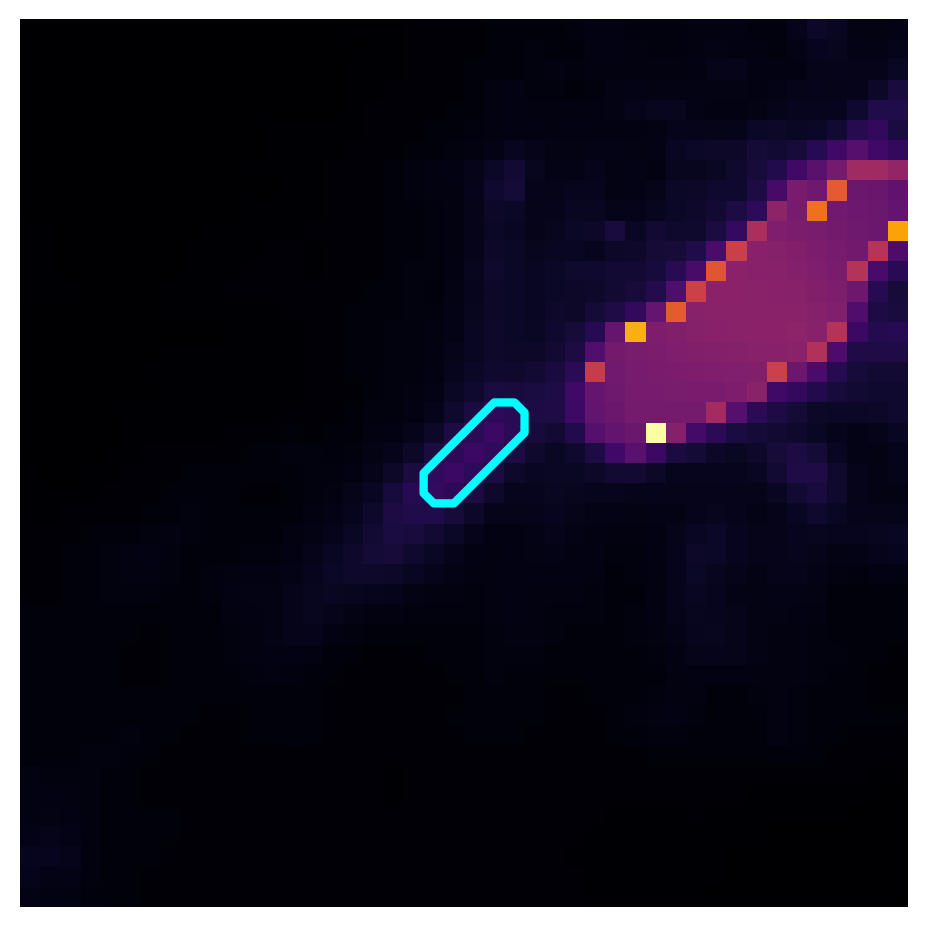

In [11]:
top_regions_data_OA = load_regions_from_pickle("top_regions_data_OA.pkl")

selected_regions = {
    region_id: data
    for region_id, data in top_regions_data_OA.items()
    if data["threshold"] > 6.0e22
    and data["fractal_dimension"] < 1.65
}

print(f"Number of regions with threshold > 6e22: {len(selected_regions)}")

for region_id in selected_regions:
    region_data = top_regions_data_OA[region_id]
    mask = region_data["region_mask"]

    # Get bounding box around region
    y_indices, x_indices = np.where(mask)
    y_min, y_max = y_indices.min(), y_indices.max()
    x_min, x_max = x_indices.min(), x_indices.max()

    # Add padding to bounding box
    padding = 20  # pixels
    y_min = max(y_min - padding, 0)
    y_max = min(y_max + padding, N_H2_OA.shape[0])
    x_min = max(x_min - padding, 0)
    x_max = min(x_max + padding, N_H2_OA.shape[1])

    # Crop map and mask
    cropped_map = N_H2_OA[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # Masked region only
    masked_region = np.where(cropped_mask, cropped_map, np.nan)

    # Plot 1: Region alone
    plt.imshow(masked_region, cmap='viridis')
    plt.title(f"Selected Region Only\nThreshold: {region_data['threshold']:.2e} | D: {region_data['fractal_dimension']:.2f} | M: {region_data['mass']:.2f} | L: {region_data['size']:.2f}")
    plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

    # Plot 2: Overlay region on full cropped map
    plt.imshow(cropped_map, cmap='inferno')
    plt.contour(cropped_mask, colors='cyan', linewidths=3)
    # plt.title("Region Overlay on Cropped Map", fontweight='bold')
    # plt.colorbar(label='Column Density')
    plt.axis('off')
    plt.show()

In [ ]:
# TO-DO before the presentation

# 1. reduce some of the data (n_regions) from Orion B, since it is going a bit higher than 2! -> usually a sign of too small regions 
# DONE for now, but a dynamic approach would be better in the future!

# 2. Make the mass calculation work out!
# WIP: by changing the formula, I do get better results, but still no 1-5 solar masses cores.
# DONE for now, but still not entirely convinced about the mass calculation.

# 3. visualize some of the structures with higest fractal dimension (and smallest) and check that they are cores
# DONE

# 4. visualize some of the structures from the other areas to show
# DONE


## 📌**Next Steps & Ideas to be Discussed**
- Tweak and review the code so far.
- Review and improve simulations (specifically in `Simulations_PA.ipynb`, as I have now a better understanding of the interpretation).
- Can we *quantitatively* link the observed fractal trends to star formation modes/efficency?
    - YSOs List from Megeath et al.
    - Relation YSOs/fractal dimension and star formation modes 🧐.
- Comparison with literature.


In [ ]:
### WORK IN PROGRESS: YSOs, FRACTAL DIMENSION AND STAR FORMATION MODES AND EFFICENCY ###

# read the YSO list

curr_folder = os.getcwd()
table_file_path = os.path.join(curr_folder, "Megeath", "table4.dat.txt")

# Define the column names (based on the provided table headers, modifying the RA and DE columns)
column_names = ['Seq', 'RA_DEC', 'Jmag', 'e_Jmag', 'Hmag', 'e_Hmag',
                'Kmag', 'e_Kmag', '[3.6]', 'e_[3.6]', '[4.5]', 'e_[4.5]', '[5.8]', 'e_[5.8]',
                '[8.0]', 'e_[8.0]', '[24]', 'e_[24]', 'AKs', 'alpha', 'Cl']

# Read the file, skipping the first few lines, assuming fixed-width formatting
data_YSOs = pd.read_fwf(table_file_path, skiprows=5, names=column_names, delimiter="|")

# Now split the 'RA_DEC' column into individual RA and DEC components based on spaces
ra_dec_split = data_YSOs['RA_DEC'].str.split(expand=True)

# Add the RA and DEC columns back to the DataFrame as integers/floats
data_YSOs['RAh'] = 5
data_YSOs['RAm'] = ra_dec_split[1].astype(float)
data_YSOs['RAs'] = ra_dec_split[2].astype(float)
data_YSOs['DEd'] = ra_dec_split[3].astype(float)
data_YSOs['DEm'] = ra_dec_split[4].astype(float)
data_YSOs['DEs'] = ra_dec_split[5].astype(float)

# Drop the original combined column
data_YSOs.drop(columns=['RA_DEC'], inplace=True)

# Convert RA/DEC to decimal degrees
data_YSOs['RA_deg'] = 15 * (data_YSOs['RAh'] + data_YSOs['RAm'] / 60 + data_YSOs['RAs'] / 3600)
data_YSOs['DEC_deg'] = data_YSOs['DEd'] + np.sign(data_YSOs['DEd'])*data_YSOs['DEm'] / 60 + np.sign(data_YSOs['DEd'])*data_YSOs['DEs'] / 3600

# print(len(data_YSOs))

# Convert YSO coordinates to pixel coordinates using WCS
# yso_coords = SkyCoord(ra=data_YSOs['RA_deg']*u.degree, dec=data_YSOs['DEC_deg']*u.degree, frame='icrs', unit=u.degree)
# yso_pixels = wcs.celestial.world_to_pixel(yso_coords)

# # Count YSOs in each region for Orion A
# ysos_in_regions_OA = {region_id: 0 for region_id in top_regions_data_OA.keys()}

# # FIX HERE
# for region_id, data in top_regions_data_OA.items():
#     mask = N_H2_OA >= data["threshold"]
#     for x, y in zip(yso_pixels[0], yso_pixels[1]):
#         if 0 <= int(y) < mask.shape[0] and 0 <= int(x) < mask.shape[1]:
#             if mask[int(y), int(x)]:
#                 ysos_in_regions_OA[region_id] += 1

# # Plot the number of YSOs in each region
# region_ids = list(ysos_in_regions_OA.keys())
# yso_counts = list(ysos_in_regions_OA.values())

# plt.figure(figsize=(10, 6))
# plt.bar(region_ids, yso_counts, color='blue', alpha=0.7)
# plt.xlabel("Region ID")
# plt.ylabel("Number of YSOs")
# plt.title("Number of YSOs in Each Region (Orion A)")
# plt.show()

# for each region: calculate how many YSOs are found within such region (update previous code?)

# plot this information somehow?